### Importing the basic Libraries

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

pd.set_option('display.max_columns', None)
sns.set()

### Importing the dataset for the predection

In [232]:
df = pd.read_csv("churn-bigml-80.csv")

### Finding the Basic Data Information
- It has 2666 Rows and 20 Columns
- There are 3 Categorical Columns (State, International plan, Voice mail plan)
- There are 16 Numerical Columns
- Target Column is Churn Which is a Binary Classification Problem
- There are no any null Value and duplicate value

In [6]:
df.shape

(2666, 20)

In [7]:
df.sample(10)

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
1262,VA,128,415,No,No,0,216.0,111,36.72,153.7,115,13.06,227.0,74,10.22,12.7,4,3.43,1,False
1421,TX,79,415,No,No,0,144.0,90,24.48,135.8,91,11.54,212.4,129,9.56,13.0,4,3.51,1,False
1103,VA,115,415,No,No,0,132.0,90,22.44,197.5,75,16.79,175.8,114,7.91,0.0,0,0.00,3,False
323,IL,84,510,No,No,0,181.5,129,30.86,130.7,112,11.11,186.5,118,8.39,8.5,4,2.30,1,False
528,ND,147,408,No,No,0,205.3,95,34.90,166.7,128,14.17,240.6,84,10.83,7.8,4,2.11,1,False
1617,NJ,162,408,No,No,0,217.6,87,36.99,279.0,71,23.72,250.7,65,11.28,10.4,4,2.81,2,True
19,AZ,130,415,No,No,0,183.0,112,31.11,72.9,99,6.20,181.8,78,8.18,9.5,19,2.57,0,False
898,LA,9,415,No,Yes,39,214.1,108,36.40,169.2,115,14.38,189.7,117,8.54,10.1,3,2.73,1,False
2586,ME,100,510,No,No,0,264.5,117,44.97,194.0,111,16.49,262.7,111,11.82,7.5,4,2.03,2,True
529,GA,112,415,No,Yes,22,181.8,110,30.91,228.1,123,19.39,262.7,141,11.82,9.2,4,2.48,2,False


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [9]:
df.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [10]:
df.duplicated().sum()

0

In [11]:
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [12]:
df.describe(include="all")

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
count,2666,2666.000000,2666.000000,2666,2666,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666
unique,51,NaN,NaN,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,WV,NaN,NaN,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
freq,88,NaN,NaN,2396,1933,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2278
mean,NaN,100.620405,437.438860,NaN,NaN,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641,NaN
std,NaN,39.563974,42.521018,NaN,NaN,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236,NaN
min,NaN,1.000000,408.000000,NaN,NaN,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000,NaN
25%,NaN,73.000000,408.000000,NaN,NaN,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000,NaN
50%,NaN,100.000000,415.000000,NaN,NaN,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000,NaN
75%,NaN,127.000000,510.000000,NaN,NaN,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000,NaN


In [13]:
df.corr(numeric_only=True)['Churn']

Account length            0.017728
Area code                 0.001019
Number vmail messages    -0.086474
Total day minutes         0.195688
Total day calls           0.018290
Total day charge          0.195689
Total eve minutes         0.072906
Total eve calls          -0.001539
Total eve charge          0.072893
Total night minutes       0.033639
Total night calls         0.012262
Total night charge        0.033635
Total intl minutes        0.086204
Total intl calls         -0.069882
Total intl charge         0.086216
Customer service calls    0.202590
Churn                     1.000000
Name: Churn, dtype: float64

### Categorical Columns EDA
- Churn --> Is the Target Column. It is the boolean data
- State --> There are 51 Unique Value as there is no impact in the Churn Rate so we ignore this column
- International Plan --> Those who have International Plan are more likly to leave the service. We nee to Label Encode this Column as well
- Voice Mail Plan --> Voice mail Plan has no impact on the Churn Rate so we will ignore this column (Keep after lookin Number Vmail Message)

### Churn
- Mostly data arroung 85% are of False Might be the case of imbalance dataset

In [16]:
df["Churn"].value_counts()

Churn
False    2278
True      388
Name: count, dtype: int64

<Axes: ylabel='count'>

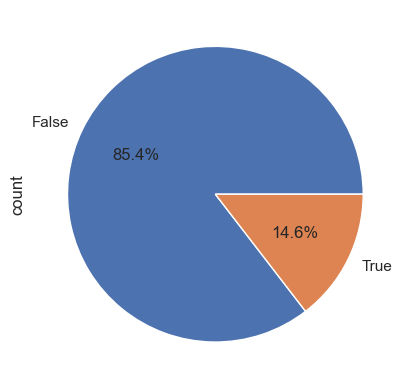

In [17]:
df['Churn'].value_counts().plot(kind='pie',autopct='%0.1f%%')

### State
- There are 51 unique States
- As per the count and cross tab we are sure if there are any particular churn based on any state as churn rate is less than 30% in any state.
- We Ignore the Categorical Column State.

In [19]:
df.State.unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'WV', 'RI', 'IA', 'MT',
       'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'NE', 'WY', 'IL', 'NH',
       'LA', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR', 'DE', 'IN', 'UT', 'CA',
       'SD', 'NC', 'WA', 'MN', 'NM', 'NV', 'DC', 'NY', 'KY', 'ME', 'MS',
       'MI', 'SC', 'TN', 'PA', 'HI', 'ND', 'CT'], dtype=object)

In [20]:
len(df.State.unique())

51

In [21]:
df.State.value_counts()

State
WV    88
MN    70
NY    68
VA    67
AL    66
OH    66
WY    66
OR    62
NV    61
WI    61
MD    60
UT    60
CO    59
CT    59
MI    58
VT    57
ID    56
NC    56
TX    55
FL    54
IN    54
MT    53
OK    52
MA    52
KS    52
MO    51
DE    51
NJ    50
SC    49
SD    49
ME    49
GA    49
RI    48
MS    48
WA    48
AR    47
IL    45
DC    45
AZ    45
NE    45
HI    44
NM    44
ND    44
AK    43
KY    43
NH    43
TN    41
IA    38
PA    36
LA    35
CA    24
Name: count, dtype: int64

In [22]:
df["State"].groupby(df["Churn"]).value_counts()

Churn  State
False  WV       81
       VA       63
       AL       59
       WY       58
       MN       57
                ..
True   AZ        3
       RI        3
       LA        3
       AK        3
       HI        2
Name: count, Length: 102, dtype: int64

In [23]:
pd.crosstab(df['Churn'],df['State'],normalize='columns')*100

State,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,GA,HI,IA,ID,IL,IN,KS,KY,LA,MA,MD,ME,MI,MN,MO,MS,MT,NC,ND,NE,NH,NJ,NM,NV,NY,OH,OK,OR,PA,RI,SC,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
Churn,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
False,93.023256,89.393939,76.595745,93.333333,79.166667,88.135593,81.355932,88.888889,84.313725,87.037037,83.673469,95.454545,92.105263,91.071429,91.111111,88.888889,80.769231,86.046512,91.428571,84.615385,76.666667,77.55102,77.586207,81.428571,90.196078,77.083333,81.132075,83.928571,90.909091,91.111111,79.069767,72.0,90.909091,78.688525,82.352941,84.848485,86.538462,88.709677,77.777778,93.75,77.55102,87.755102,87.804878,70.909091,86.666667,94.029851,89.473684,79.166667,93.442623,92.045455,87.878788
True,6.976744,10.606061,23.404255,6.666667,20.833333,11.864407,18.644068,11.111111,15.686275,12.962963,16.326531,4.545455,7.894737,8.928571,8.888889,11.111111,19.230769,13.953488,8.571429,15.384615,23.333333,22.44898,22.413793,18.571429,9.803922,22.916667,18.867925,16.071429,9.090909,8.888889,20.930233,28.0,9.090909,21.311475,17.647059,15.151515,13.461538,11.290323,22.222222,6.25,22.44898,12.244898,12.195122,29.090909,13.333333,5.970149,10.526316,20.833333,6.557377,7.954545,12.121212


<Axes: xlabel='State'>

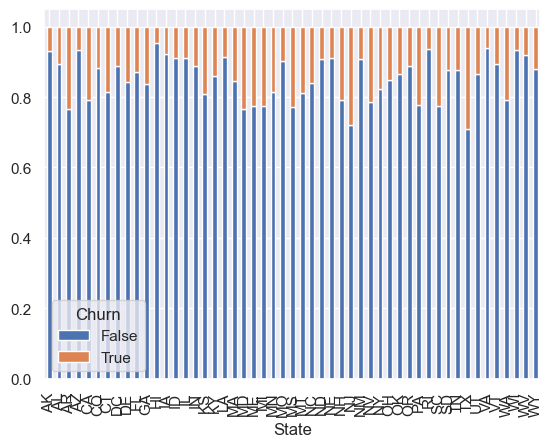

In [24]:
pd.crosstab(df['State'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

### International plan
- There are Either Yes or No Values
- As per the data those who have the international plan is more likely to Exit the Service

In [26]:
df["International plan"].unique()

array(['No', 'Yes'], dtype=object)

In [27]:
df["International plan"].value_counts()

International plan
No     2396
Yes     270
Name: count, dtype: int64

<Axes: ylabel='count'>

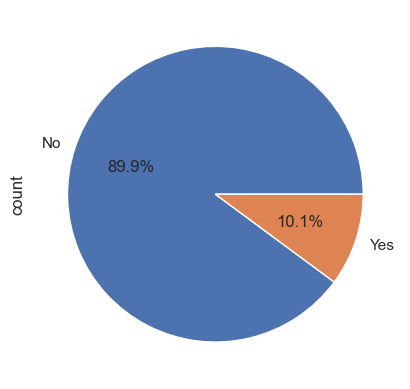

In [28]:
df['International plan'].value_counts().plot(kind='pie',autopct='%0.1f%%')

In [29]:
pd.crosstab(df['Churn'],df['International plan'],normalize='columns')*100

International plan,No,Yes
Churn,,
False,88.731219,56.296296
True,11.268781,43.703704


<Axes: xlabel='International plan'>

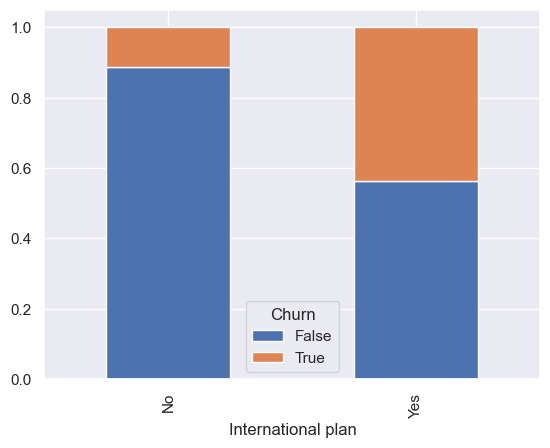

In [30]:
pd.crosstab(df['International plan'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

### Voice mail plan
- There are Either Yes or No Values
- As per the data there is no any impact on the Churn Rate for with context to voice mail so we will ignore this column as well
- We planned to ignore but after looking at the Number of Vmail message Column we conclude to ignore that column and keep this column

In [32]:
df["Voice mail plan"].unique()

array(['Yes', 'No'], dtype=object)

In [33]:
df["Voice mail plan"].value_counts()

Voice mail plan
No     1933
Yes     733
Name: count, dtype: int64

<Axes: ylabel='count'>

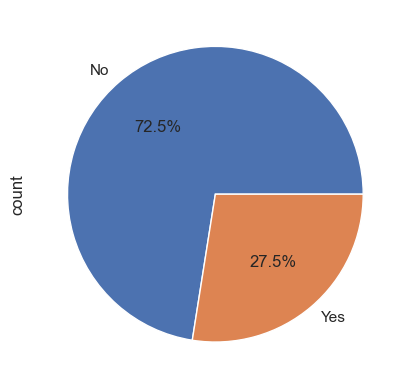

In [34]:
df['Voice mail plan'].value_counts().plot(kind='pie',autopct='%0.1f%%')

In [35]:
pd.crosstab(df['Churn'],df['Voice mail plan'],normalize='columns')*100

Voice mail plan,No,Yes
Churn,,
False,83.290222,91.132333
True,16.709778,8.867667


<Axes: xlabel='Voice mail plan'>

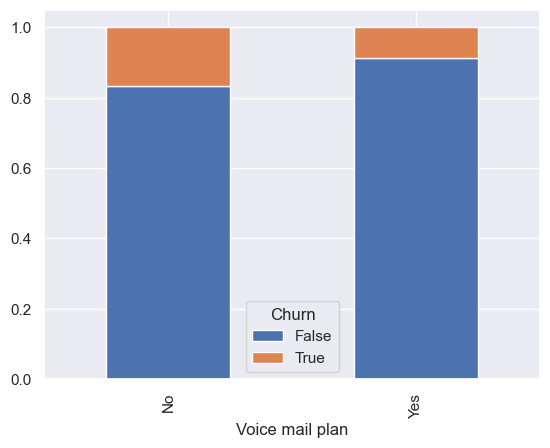

In [36]:
pd.crosstab(df['Voice mail plan'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

### Numerical Column
- Account Length --> Uniform distribution having no impact on target column or any other columns So we ignore
- Area code  --> 3 Unique Code baving no impact on target column or any other columns So we ignore
- Number vmail messages --> As It is related to Voice Mail Plan we will ignore this column and keep the Voice Mail Plan Column, After Pairplot of new_df
- Total day minutes  --> High Correlation with Total day charge so we can ignore either column. More Day Minutes are more likly to exit
- Total day calls --> As There is equal probality of leaving the service on context of day calls so we ignore this feature
- Total day charge  --> Positively correlated with total day minutes so as per the corelation with the target column we ignore this column
- Total eve minutes --> High Correlation with Total eve charge so we can ignore either column. More Eve Minutes are shighly more likly to exit
- Total eve calls -->  As there is equal probalitly so we ignore this column
- 
Total eve charg --> Positively correlated with total eve minutes so as per the corelation with the target column we ignore this column
- 9
Total night minu --> Not any clear reason but yet we decide to keep this feature
- 94
Total night ca--> As there is equal probalitly so we ignore this column
- 007
Total night c --> Positively correlated with Total night minutes so we decide to ignore this column
- 8999
Total intl m --> Thoes who have internation plan and high intl minutes are more likely to exit
- 11369
Total intl--> As there is equal probalitly so we ignore this column
- 017627
Total intl--> Positively correlated with Total intl minutes so we decide to ignore this column
- .011383
Customer serv --> With more than 4 Service call are more likely to exit the serviceice calls

In [519]:
col_to_drop = ["State",
               "Account length",
               "Account size",
               "Area code",
               "Total day calls",
               "Day calls",
               "Total day charge",
               "Eve minutes",
               "Total eve calls",
               "Eve calls",
               "Total eve charge",
               "Night minutes",
               "Total night calls",
               "Night calls",
               "Total night charge",
               "Total intl calls",
               "Intl calls",
               "Total intl charge",
               "Cust calls"
              ]

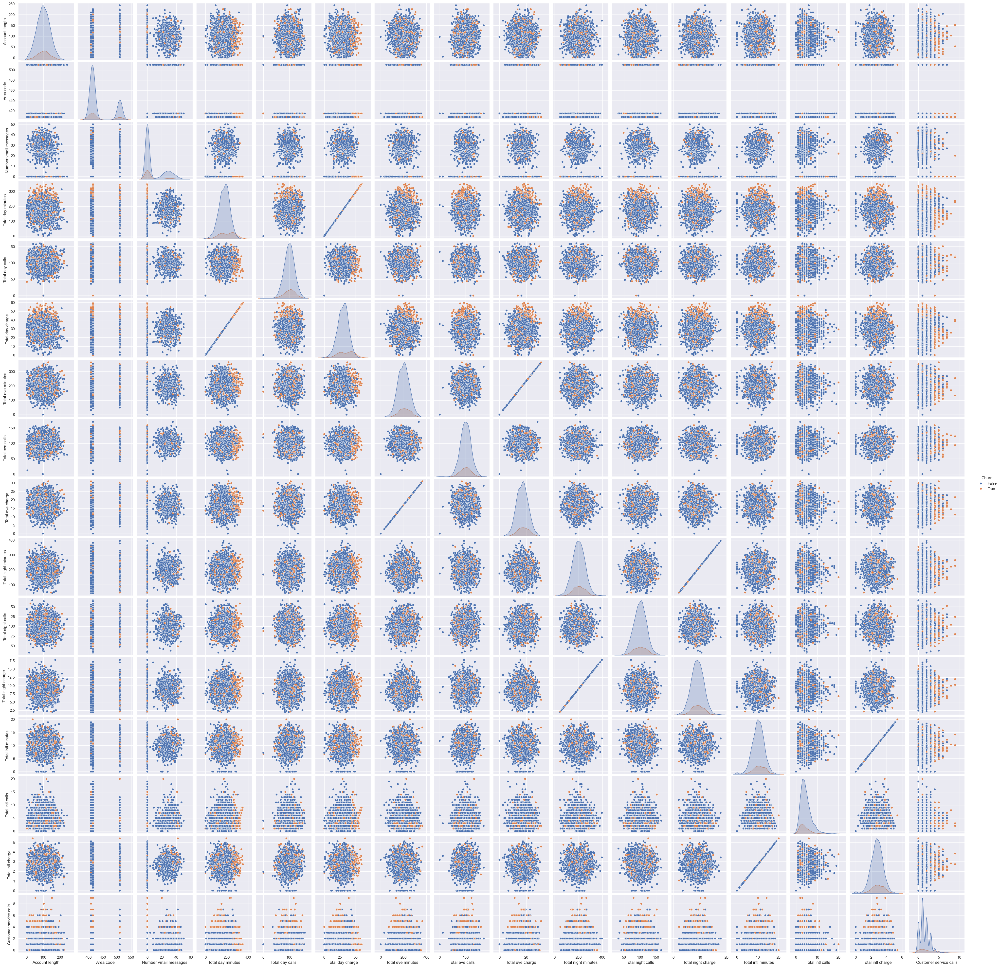

In [38]:
sns.pairplot(df,hue='Churn')

<Axes: >

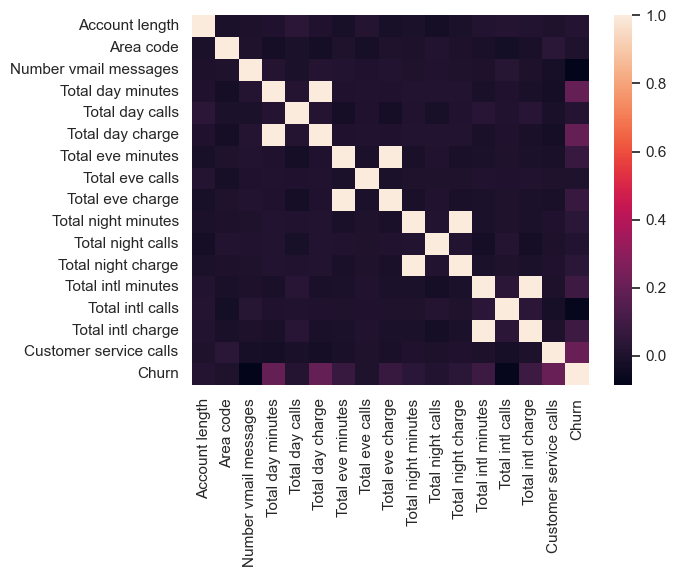

In [39]:
sns.heatmap(df.corr(numeric_only = True))

### Defining a Function to find the correalation

In [138]:
num_df = df.drop(['State','International plan','Voice mail plan'],axis=1) # Defining the Numerical Column
def corr_value(col_to_rel):
    corelation = num_df.corr()[col_to_rel]
    print(f"The Corelation value with respect to {col_to_rel} is: ")
    print(corelation)

### Account length 
- Uniformly distributed
- No Impact on any column or Traget Column as there is equal probality of Churn rate
- So we drop this column

In [41]:
df["Account length"].describe()

count    2666.000000
mean      100.620405
std        39.563974
min         1.000000
25%        73.000000
50%       100.000000
75%       127.000000
max       243.000000
Name: Account length, dtype: float64

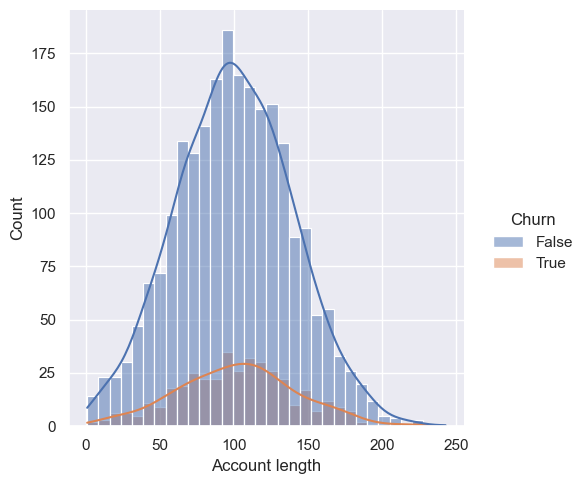

In [258]:
sns.displot(data = df, x='Account length',hue="Churn",kde=True)

<Axes: ylabel='Account length'>

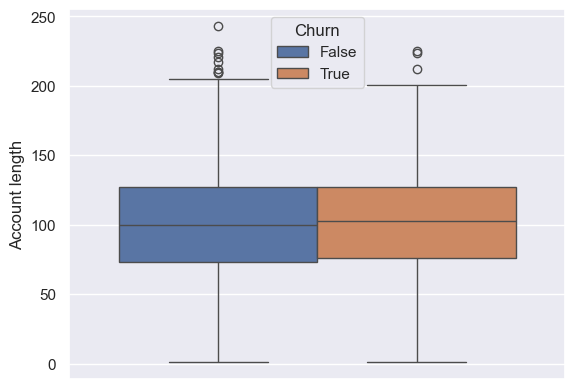

In [43]:
sns.boxplot(data= df,y = 'Account length', hue= "Churn")

In [214]:
len(df['Account length'].unique())

205

In [246]:
# As there are 205 Unique value create a new colume as per the 50% Quartile Distribution
# <=73 , 73-100, 100-127,>127
def transform_account_lenght(num):
    if num <= 73:
        return "Less than 73"
    elif num >73 and num <= 100:
        return "Between 73 and 100"
    elif num >100 and num <= 127:
        return "Between 100 and 127"
    else:
        return "Greater than 127"


In [291]:
df['Account size'] = df['Account length'].apply(transform_account_lenght)

In [293]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Day calls,Account size
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 101,Greater than 127
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Greater than 101,Between 100 and 127
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 101,Greater than 127
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Less than 101,Between 73 and 100
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Greater than 101,Between 73 and 100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False,Less than 101,Between 73 and 100
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False,Less than 101,Greater than 127
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False,Less than 101,Less than 73
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False,Greater than 101,Less than 73


In [295]:
pd.crosstab(df['Account size'],df['Churn'],normalize='index')

Churn,False,True
Account size,,
Between 100 and 127,0.842579,0.157421
Between 73 and 100,0.850523,0.149477
Greater than 127,0.855623,0.144377
Less than 73,0.869048,0.130952


<Axes: xlabel='Account size'>

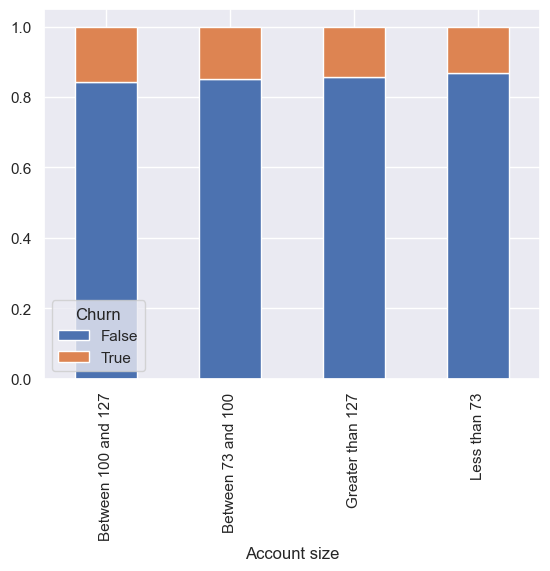

In [297]:
pd.crosstab(df['Account size'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [260]:
corr_value('Account length')

The Corelation value with respect to Account length is: 
Account length            1.000000
Area code                -0.008620
Number vmail messages    -0.002996
Total day minutes         0.002847
Total day calls           0.038862
Total day charge          0.002843
Total eve minutes        -0.015923
Total eve calls           0.018552
Total eve charge         -0.015909
Total night minutes      -0.008994
Total night calls        -0.024007
Total night charge       -0.008999
Total intl minutes        0.011369
Total intl calls          0.017627
Total intl charge         0.011383
Customer service calls    0.002455
Churn                     0.017728
Name: Account length, dtype: float64


### Area code 
- 3 area code
- There is no impact of Area code on the Target Variable as per the corelation 
- There is no impact on other columns 
- We will ignore this column

In [46]:
df["Area code"].describe()

count    2666.000000
mean      437.438860
std        42.521018
min       408.000000
25%       408.000000
50%       415.000000
75%       510.000000
max       510.000000
Name: Area code, dtype: float64

In [47]:
df["Area code"].unique()

array([415, 408, 510], dtype=int64)

<Axes: xlabel='Area code'>

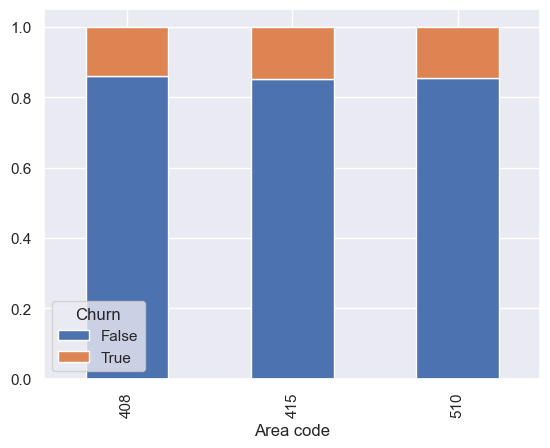

In [206]:
pd.crosstab(df['Area code'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [49]:
pd.crosstab(df['Churn'],df['Area code'],normalize='columns')*100

Area code,408,415,510
Churn,,,
False,85.949178,85.204856,85.419735
True,14.050822,14.795144,14.580265


In [50]:
pd.crosstab(df['International plan'],df['Area code'],normalize='columns')*100

Area code,408,415,510
International plan,,,
No,91.330344,90.364188,87.481591
Yes,8.669656,9.635812,12.518409


In [51]:
pd.crosstab(df['Voice mail plan'],df['Area code'],normalize='columns')*100

Area code,408,415,510
Voice mail plan,,,
No,73.542601,72.230653,72.017673
Yes,26.457399,27.769347,27.982327


In [136]:
corr_value('Area code')

The Corelation value with respect to Area code is: 
Account length           -0.008620
Area code                 1.000000
Number vmail messages    -0.000584
Total day minutes        -0.023134
Total day calls          -0.009629
Total day charge         -0.023130
Total eve minutes         0.000679
Total eve calls          -0.018602
Total eve charge          0.000707
Total night minutes      -0.003353
Total night calls         0.011455
Total night charge       -0.003382
Total intl minutes       -0.013418
Total intl calls         -0.027423
Total intl charge        -0.013534
Customer service calls    0.034442
Churn                     0.001019
Name: Area code, dtype: float64


### Number vmail messages
- Who dont have Voice Mail Plan does not have the Vmail Message (So, Directly Related)
- We will decide which feature (Voice Mail Plan or Number Vmail Message) to  consider after Encoding the Categorical Columns
- From the finding we conclude that we will ignore this column and take the Voice Mail Plan Column. After pair plot of new_df
- Try to do the further finding with related to the Voice Mail Plan for the Remaining Numerical Column

In [53]:
df["Number vmail messages"].describe()

count    2666.000000
mean        8.021755
std        13.612277
min         0.000000
25%         0.000000
50%         0.000000
75%        19.000000
max        50.000000
Name: Number vmail messages, dtype: float64

In [54]:
df["Number vmail messages"].unique()

array([25, 26,  0, 24, 37, 27, 33, 39, 41, 28, 30, 34, 46, 35, 21, 42, 36,
       22, 23, 43, 31, 38, 40, 29, 18, 32, 17, 45, 16, 14, 20, 19, 15, 12,
       47,  8, 44,  4, 10, 13, 50,  9], dtype=int64)

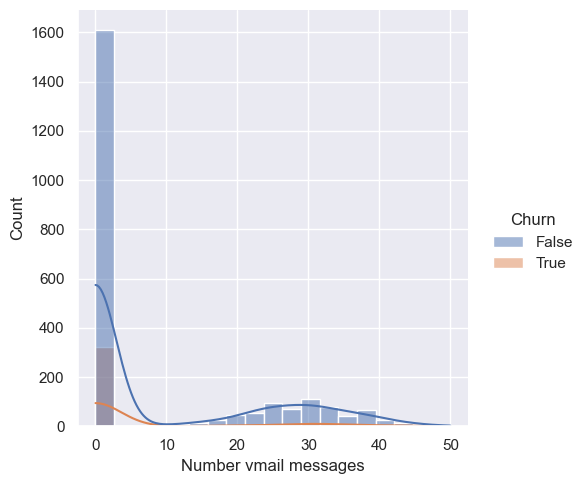

In [583]:
sns.displot(data=df, x= 'Number vmail messages',hue="Churn",kde=True)

In [56]:
pd.crosstab(df['Number vmail messages'],df['Voice mail plan'],normalize='index')*100

Voice mail plan,No,Yes
Number vmail messages,,
0,100.0,0.0
4,0.0,100.0
8,0.0,100.0
9,0.0,100.0
10,0.0,100.0
12,0.0,100.0
13,0.0,100.0
14,0.0,100.0
15,0.0,100.0


In [57]:
pd.crosstab(df['Number vmail messages'],df['Churn'],normalize='index')*100

Churn,False,True
Number vmail messages,,
0,83.290222,16.709778
4,100.000000,0.000000
8,100.000000,0.000000
9,100.000000,0.000000
10,100.000000,0.000000
12,100.000000,0.000000
13,100.000000,0.000000
14,100.000000,0.000000
15,100.000000,0.000000


In [58]:
df.groupby(df["Voice mail plan"])["Number vmail messages"].value_counts()

Voice mail plan  Number vmail messages
No               0                        1933
Yes              31                         50
                 28                         42
                 29                         39
                 24                         37
                 33                         37
                 30                         35
                 27                         34
                 32                         33
                 25                         33
                 26                         32
                 23                         30
                 37                         25
                 35                         24
                 22                         24
                 36                         23
                 34                         23
                 21                         22
                 39                         22
                 38                         22
                 19  

In [150]:
corr_value('Number vmail messages')

The Corelation value with respect to Number vmail messages is: 
Account length           -0.002996
Area code                -0.000584
Number vmail messages     1.000000
Total day minutes         0.019027
Total day calls          -0.009622
Total day charge          0.019027
Total eve minutes         0.011401
Total eve calls           0.005131
Total eve charge          0.011418
Total night minutes      -0.000224
Total night calls         0.008124
Total night charge       -0.000229
Total intl minutes       -0.004156
Total intl calls          0.027013
Total intl charge        -0.004136
Customer service calls   -0.018787
Churn                    -0.086474
Name: Number vmail messages, dtype: float64


### Total day minutes 
- Total day minutes and total day charge are correlated so we will use the feature which is highly correlated with the Target Column.
- As both are equally correated with the Churn so We will drop the Total day charge Feature
- Those who have high total day minutes are more likly to exit
- Who don't have Voice mail plan and have higher day minutes are more likely to exit
- When there is False Churn Rate there are some of outlires.

In [60]:
df["Total day minutes"].describe()

count    2666.00000
mean      179.48162
std        54.21035
min         0.00000
25%       143.40000
50%       179.95000
75%       215.90000
max       350.80000
Name: Total day minutes, dtype: float64

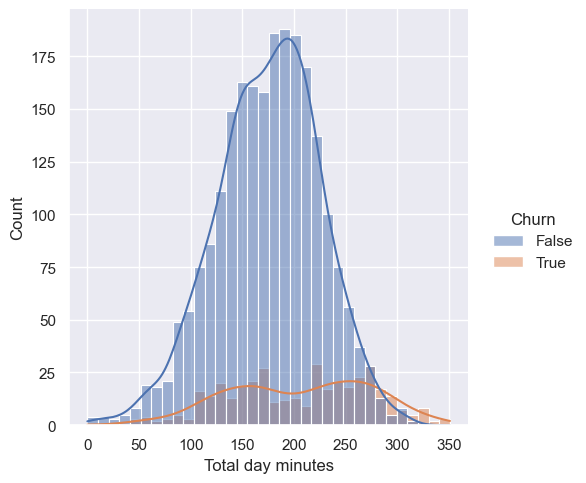

In [61]:
sns.displot(data = df, x = 'Total day minutes',kde=True, hue = "Churn")

<Axes: ylabel='Total day minutes'>

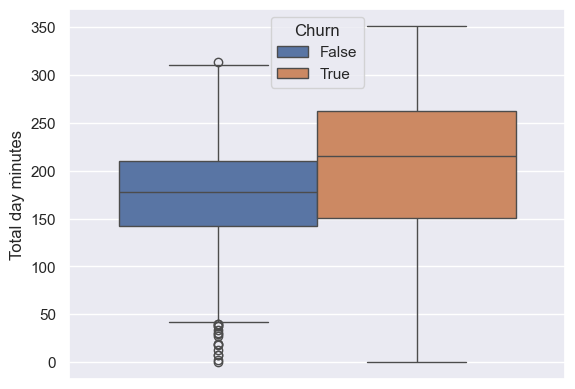

In [62]:
sns.boxplot(data= df,y = 'Total day minutes', hue= "Churn")

<Axes: xlabel='Total day minutes', ylabel='Total day minutes'>

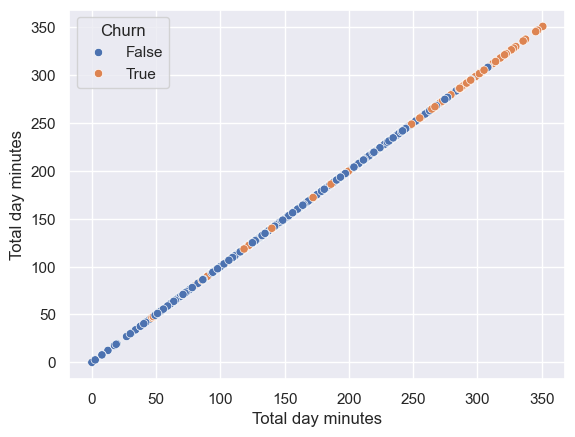

In [63]:
sns.scatterplot(data= df,x = 'Total day minutes',y = 'Total day minutes', hue= "Churn")

<Axes: xlabel='Total day minutes', ylabel='Total day charge'>

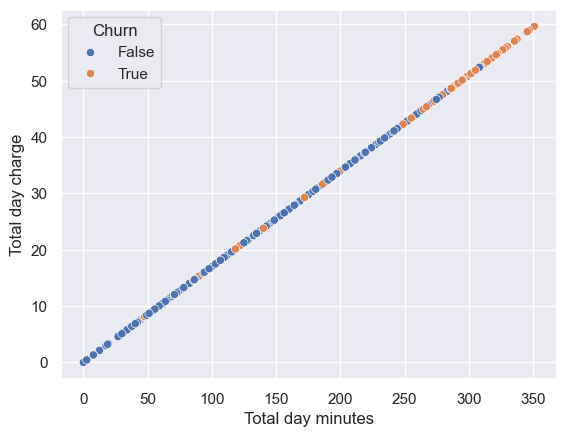

In [65]:
sns.scatterplot(data= df,x = 'Total day minutes',y = 'Total day charge', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total day minutes'>

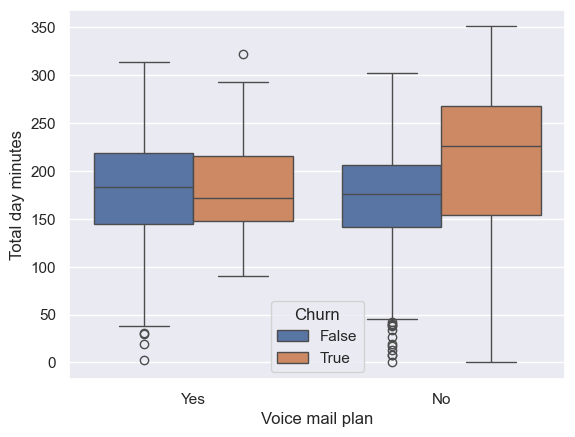

In [67]:
sns.boxplot(data= df,y = 'Total day minutes' ,x = "Voice mail plan", hue= "Churn")

<Axes: xlabel='Number vmail messages', ylabel='Total day minutes'>

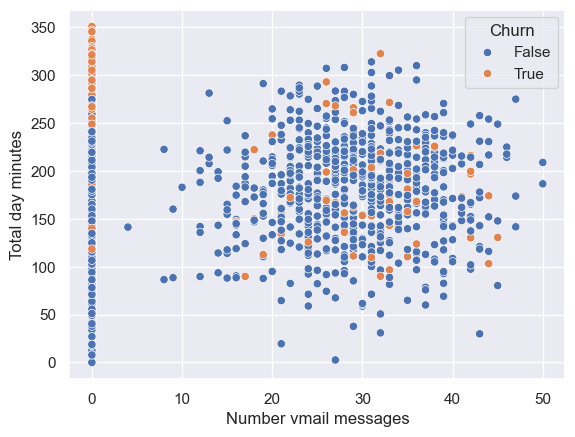

In [68]:
sns.scatterplot(data= df,y = 'Total day minutes',x = 'Number vmail messages', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total day minutes'>

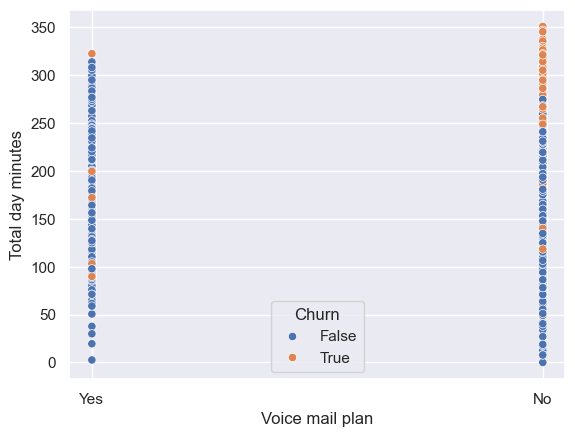

In [70]:
sns.scatterplot(data= df,y = 'Total day minutes',x = 'Voice mail plan', hue= "Churn")

In [152]:
corr_value("Total day minutes")

The Corelation value with respect to Total day minutes is: 
Account length            0.002847
Area code                -0.023134
Number vmail messages     0.019027
Total day minutes         1.000000
Total day calls           0.016780
Total day charge          1.000000
Total eve minutes         0.003999
Total eve calls           0.009059
Total eve charge          0.003992
Total night minutes       0.013491
Total night calls         0.015054
Total night charge        0.013464
Total intl minutes       -0.011042
Total intl calls          0.005687
Total intl charge        -0.010934
Customer service calls   -0.024543
Churn                     0.195688
Name: Total day minutes, dtype: float64


In [154]:
cor_min = df['Total day minutes'].corr(df['Churn'])
cor_charge = df['Total day charge'].corr(df['Churn'])
print(f"The correlation between Total day minutes and Churn is {cor_min}")
print(f"The correlation between Total day Charge and Churn is {cor_charge}")

The correlation between Total day minutes and Churn is 0.19568792621993641
The correlation between Total day Charge and Churn is 0.1956889296396763


### Total day calls
- There is no any relation of the total day calls with other columns 
- we can ignore this column for our model 
- There is equal probality of leaving the service on context of day calls

In [73]:
df["Total day calls"].describe()

count    2666.000000
mean      100.310203
std        19.988162
min         0.000000
25%        87.000000
50%       101.000000
75%       114.000000
max       160.000000
Name: Total day calls, dtype: float64

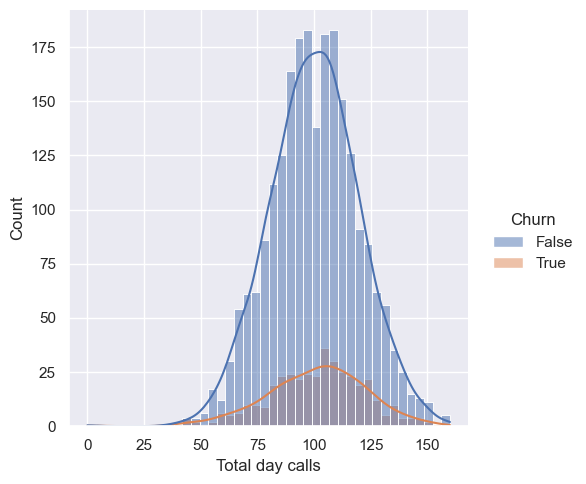

In [74]:
sns.displot(data = df, x = 'Total day calls',kde=True, hue = "Churn")

<Axes: ylabel='Total day calls'>

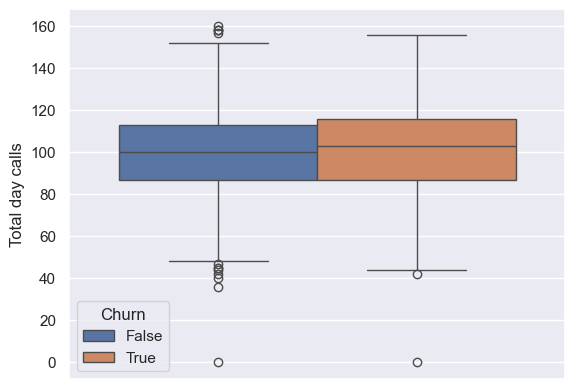

In [77]:
sns.boxplot(data= df,y = 'Total day calls', hue= "Churn")

<Axes: xlabel='Total day calls', ylabel='Total day calls'>

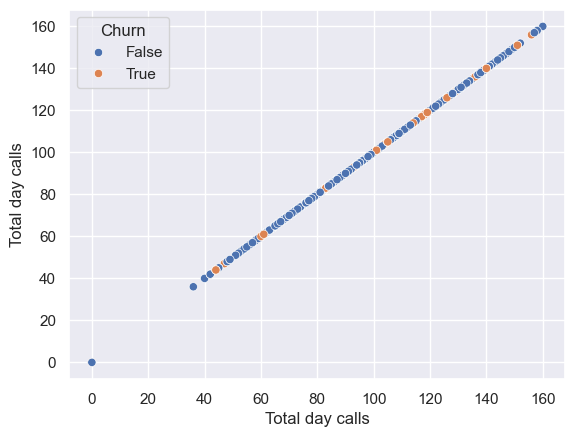

In [79]:
sns.scatterplot(data= df,x = 'Total day calls',y = 'Total day calls', hue= "Churn")

<Axes: xlabel='Total day calls', ylabel='Total day minutes'>

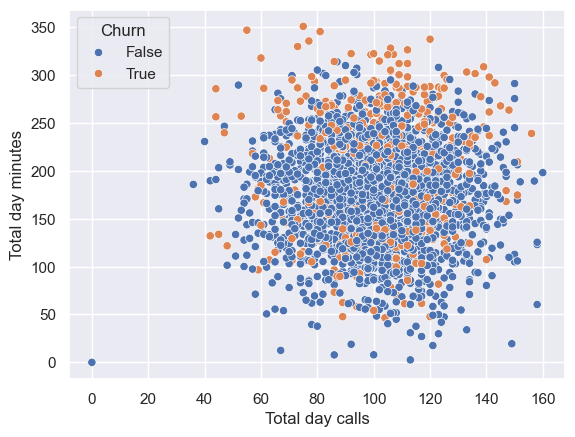

In [158]:
sns.scatterplot(data= df,x = 'Total day calls',y = 'Total day minutes', hue= "Churn")

In [276]:
len(df['Total day calls'].unique())

115

In [278]:
# As there are 115 Unique value create a new colume as per the 50% Quartile Distribution
# <=75 , 73-100, 100-127,>127
def transform_day_calls(num):
    if num <= 101:
        return "Less than 101"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 101"

In [300]:
df['Day calls'] = df['Total day calls'].apply(transform_day_calls)

In [302]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Day calls,Account size
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 101,Greater than 127
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Greater than 101,Between 100 and 127
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 101,Greater than 127
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Less than 101,Between 73 and 100
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Greater than 101,Between 73 and 100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False,Less than 101,Between 73 and 100
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False,Less than 101,Greater than 127
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False,Less than 101,Less than 73
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False,Greater than 101,Less than 73


<Axes: xlabel='Day calls'>

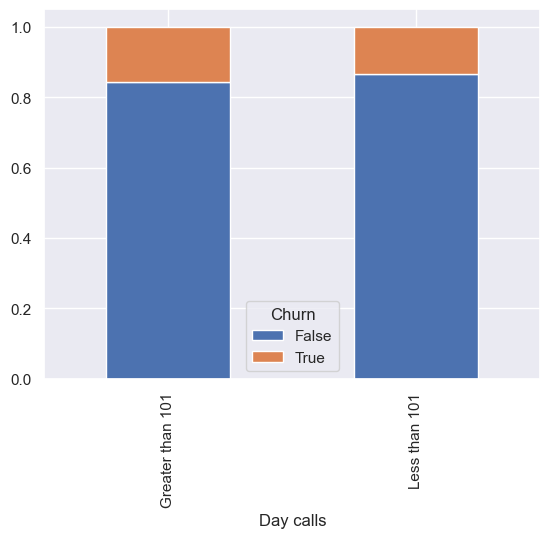

In [304]:
pd.crosstab(df['Day calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [156]:
corr_value('Total day calls')

The Corelation value with respect to Total day calls is: 
Account length            0.038862
Area code                -0.009629
Number vmail messages    -0.009622
Total day minutes         0.016780
Total day calls           1.000000
Total day charge          0.016787
Total eve minutes        -0.026003
Total eve calls           0.006473
Total eve charge         -0.026006
Total night minutes       0.008986
Total night calls        -0.016776
Total night charge        0.008972
Total intl minutes        0.031036
Total intl calls          0.006928
Total intl charge         0.031133
Customer service calls   -0.011945
Churn                     0.018290
Name: Total day calls, dtype: float64


### Total day charge 
- Higly correalted with the Total day minutes so we ignore this column

<Axes: xlabel='Total day minutes', ylabel='Total day charge'>

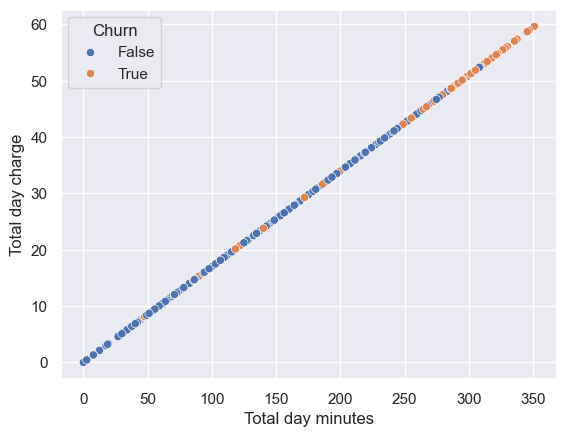

In [165]:
sns.scatterplot(data= df,x = 'Total day minutes',y = 'Total day charge', hue= "Churn")

In [167]:
corr_value("Total day charge")

The Corelation value with respect to Total day charge is: 
Account length            0.002843
Area code                -0.023130
Number vmail messages     0.019027
Total day minutes         1.000000
Total day calls           0.016787
Total day charge          1.000000
Total eve minutes         0.004008
Total eve calls           0.009056
Total eve charge          0.004002
Total night minutes       0.013495
Total night calls         0.015057
Total night charge        0.013468
Total intl minutes       -0.011046
Total intl calls          0.005688
Total intl charge        -0.010938
Customer service calls   -0.024548
Churn                     0.195689
Name: Total day charge, dtype: float64


In [169]:
cor_min = df['Total day minutes'].corr(df['Churn'])
cor_charge = df['Total day charge'].corr(df['Churn'])
print(f"The correlation between Total day minutes and Churn is {cor_min}")
print(f"The correlation between Total day Charge and Churn is {cor_charge}")

The correlation between Total day minutes and Churn is 0.19568792621993641
The correlation between Total day Charge and Churn is 0.1956889296396763


### Total eve minutes
- Total eve minutes and total eve charge are correlated so we will use the feature which is highly correlated with the Target Column.
- As both are equally correated with the Churn so We will drop the Total eve charge Feature
- Those who have high total eve minutes are slightly more likly to exit
- Who don't have Voice mail plan and have higher eve minutes are shigly more likely to exit
- There are some outliers in both Churn Rate so need to treat the outliers

In [174]:
df["Total eve minutes"].describe()

count    2666.000000
mean      200.386159
std        50.951515
min         0.000000
25%       165.300000
50%       200.900000
75%       235.100000
max       363.700000
Name: Total eve minutes, dtype: float64

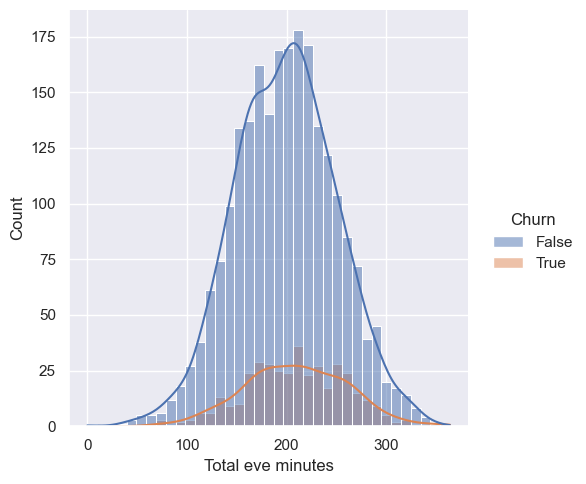

In [176]:
sns.displot(data = df, x = 'Total eve minutes',kde=True, hue = "Churn")

<Axes: ylabel='Total eve minutes'>

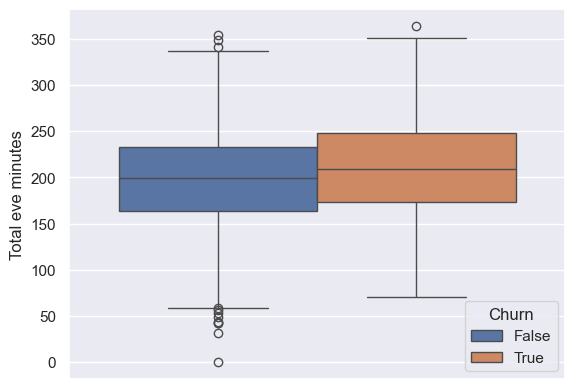

In [178]:
sns.boxplot(data= df,y = 'Total eve minutes', hue= "Churn")

<Axes: xlabel='Total eve minutes', ylabel='Total eve minutes'>

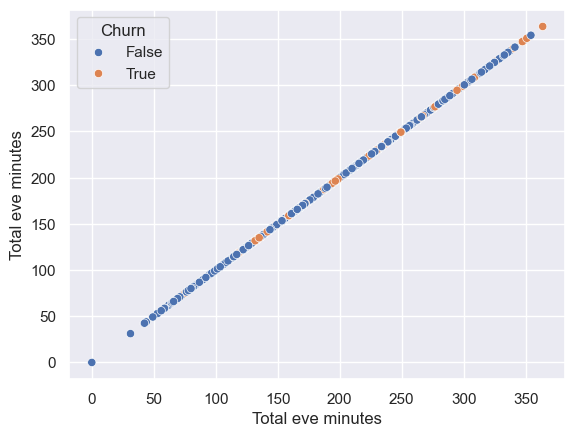

In [180]:
sns.scatterplot(data= df,x = 'Total eve minutes',y = 'Total eve minutes', hue= "Churn")

<Axes: xlabel='Total eve minutes', ylabel='Total eve charge'>

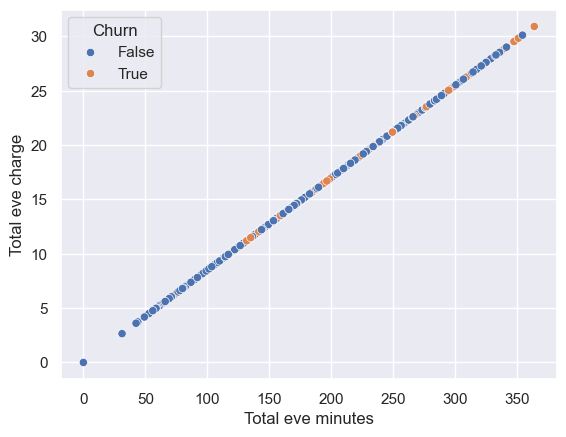

In [182]:
sns.scatterplot(data= df,x = 'Total eve minutes',y = 'Total eve charge', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total eve minutes'>

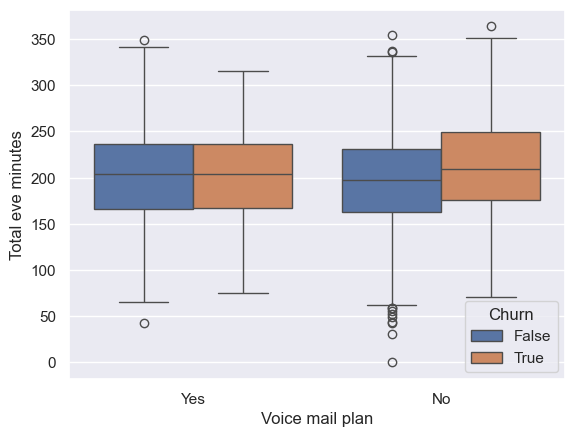

In [184]:
sns.boxplot(data= df,y = 'Total eve minutes' ,x = "Voice mail plan", hue= "Churn")

<Axes: xlabel='Number vmail messages', ylabel='Total eve minutes'>

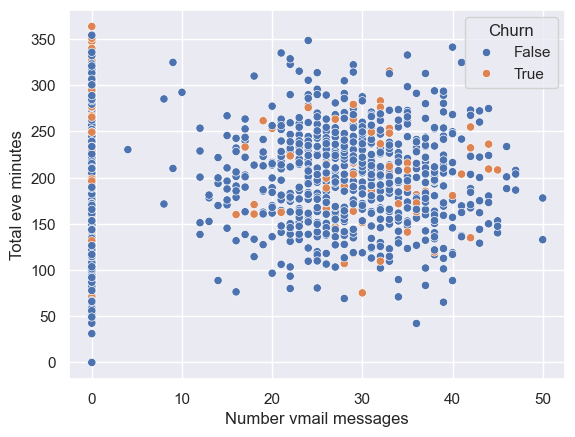

In [186]:
sns.scatterplot(data= df,y = 'Total eve minutes',x = 'Number vmail messages', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total eve minutes'>

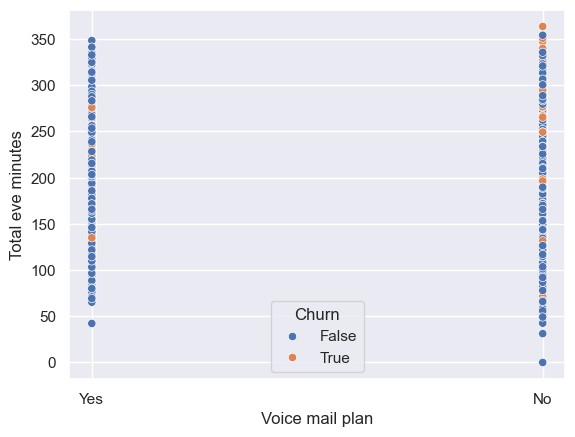

In [188]:
sns.scatterplot(data= df,y = 'Total eve minutes',x = 'Voice mail plan', hue= "Churn")

In [306]:
len(df["Total eve minutes"].unique())

1442

In [308]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
# <=75 , 73-100, 100-127,>127
def transform_eve_mins(num):
    if num <= 200:
        return "Less than 200"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 200"

In [310]:
df["Eve minutes"] = df["Total eve minutes"].apply(transform_eve_mins)

In [312]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Day calls,Account size,Eve minutes
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 101,Greater than 127,Less than 200
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Greater than 101,Between 100 and 127,Less than 200
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 101,Greater than 127,Less than 200
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Less than 101,Between 73 and 100,Less than 200
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Greater than 101,Between 73 and 100,Less than 200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False,Less than 101,Between 73 and 100,Less than 200
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False,Less than 101,Greater than 127,Greater than 200
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False,Less than 101,Less than 73,Less than 200
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False,Greater than 101,Less than 73,Greater than 200


<Axes: xlabel='Eve minutes'>

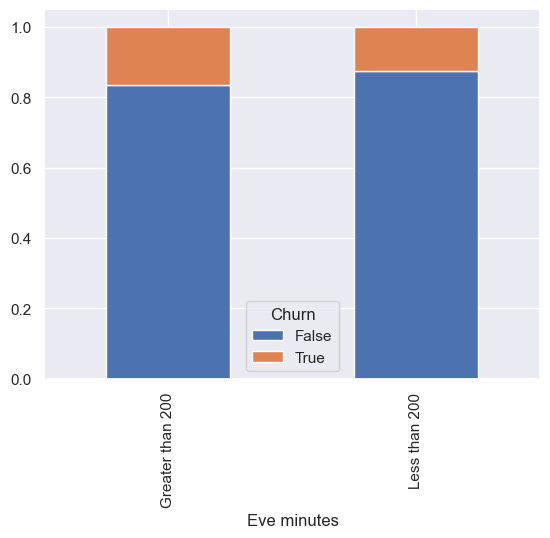

In [314]:
pd.crosstab(df['Eve minutes'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [190]:
corr_value("Total eve minutes")

The Corelation value with respect to Total eve minutes is: 
Account length           -0.015923
Area code                 0.000679
Number vmail messages     0.011401
Total day minutes         0.003999
Total day calls          -0.026003
Total day charge          0.004008
Total eve minutes         1.000000
Total eve calls          -0.007654
Total eve charge          1.000000
Total night minutes      -0.013414
Total night calls         0.009017
Total night charge       -0.013450
Total intl minutes       -0.006915
Total intl calls          0.002160
Total intl charge        -0.006947
Customer service calls   -0.013192
Churn                     0.072906
Name: Total eve minutes, dtype: float64


In [194]:
cor_min = df['Total eve minutes'].corr(df['Churn'])
cor_charge = df['Total eve charge'].corr(df['Churn'])
print(f"The correlation between Total eve minutes and Churn is {cor_min}")
print(f"The correlation between Total eve Charge and Churn is {cor_charge}")

The correlation between Total eve minutes and Churn is 0.07290626808163188
The correlation between Total eve Charge and Churn is 0.07289326915576914


### Total eve calls
- It has the equal probalbility so it can be ignored

In [202]:
df["Total eve calls"].describe()

count    2666.000000
mean      100.023631
std        20.161445
min         0.000000
25%        87.000000
50%       100.000000
75%       114.000000
max       170.000000
Name: Total eve calls, dtype: float64

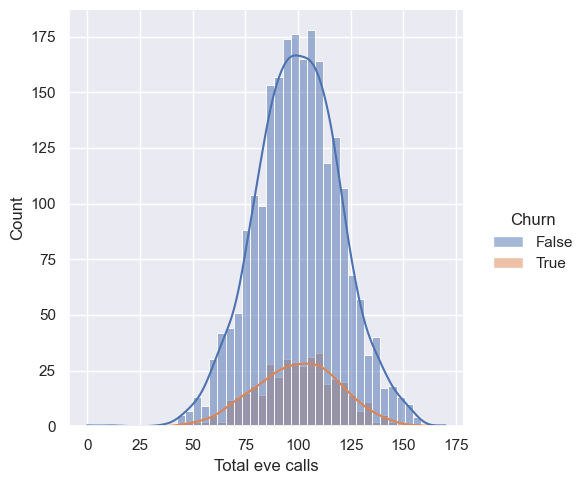

In [204]:
sns.displot(data = df, x = 'Total eve calls',kde=True, hue = "Churn")

In [316]:
 len(df["Total eve calls"].unique())

120

In [318]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
# <=75 , 73-100, 100-127,>127
def transform_eve_calls(num):
    if num <= 100:
        return "Less than 100"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 100"

In [320]:
df["Eve calls"] = df["Total eve calls"].apply(transform_eve_calls)

In [322]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Day calls,Account size,Eve minutes,Eve calls
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 101,Greater than 127,Less than 200,Less than 100
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Greater than 101,Between 100 and 127,Less than 200,Greater than 100
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 101,Greater than 127,Less than 200,Greater than 100
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Less than 101,Between 73 and 100,Less than 200,Less than 100
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Greater than 101,Between 73 and 100,Less than 200,Greater than 100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False,Less than 101,Between 73 and 100,Less than 200,Less than 100
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False,Less than 101,Greater than 127,Greater than 200,Greater than 100
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False,Less than 101,Less than 73,Less than 200,Less than 100
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False,Greater than 101,Less than 73,Greater than 200,Less than 100


<Axes: xlabel='Eve calls'>

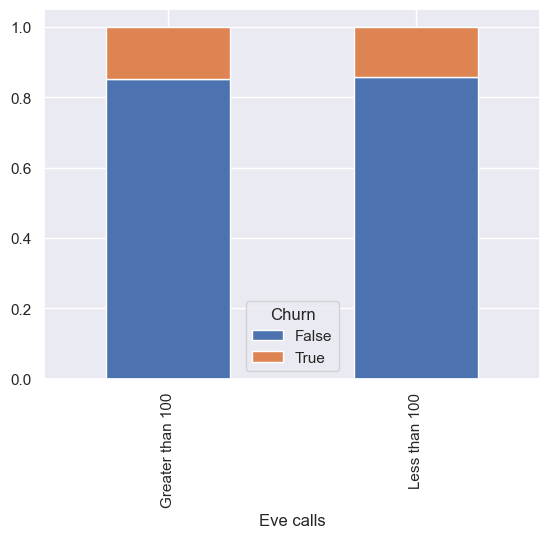

In [324]:
pd.crosstab(df['Eve calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [326]:
corr_value("Total eve calls")

The Corelation value with respect to Total eve calls is: 
Account length            0.018552
Area code                -0.018602
Number vmail messages     0.005131
Total day minutes         0.009059
Total day calls           0.006473
Total day charge          0.009056
Total eve minutes        -0.007654
Total eve calls           1.000000
Total eve charge         -0.007642
Total night minutes      -0.000175
Total night calls         0.000797
Total night charge       -0.000135
Total intl minutes        0.011012
Total intl calls          0.003710
Total intl charge         0.011000
Customer service calls    0.001058
Churn                    -0.001539
Name: Total eve calls, dtype: float64


### Total eve charge
- As it is postivily related to Total eve minutes so we ignore this column

### Total night minutes
- It doesnot have that much impact on the target or any other column yet we decide to keep this feature
- Positively correlated with Total night charge hence we keep this feature only

In [339]:
df["Total night minutes"].describe()

count    2666.000000
mean      201.168942
std        50.780323
min        43.700000
25%       166.925000
50%       201.150000
75%       236.475000
max       395.000000
Name: Total night minutes, dtype: float64

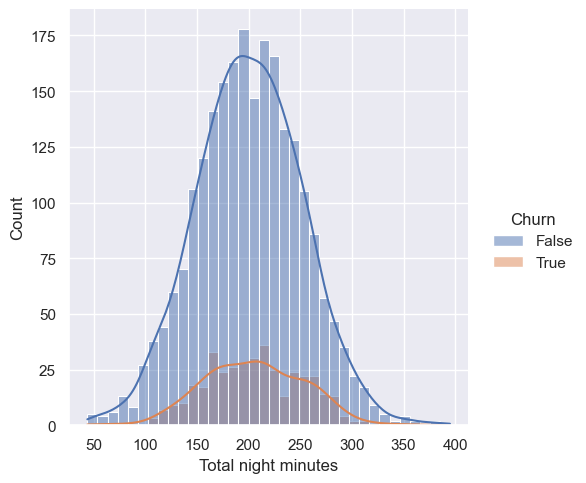

In [341]:
sns.displot(data = df, x = 'Total night minutes',kde=True, hue = "Churn")

<Axes: ylabel='Total night minutes'>

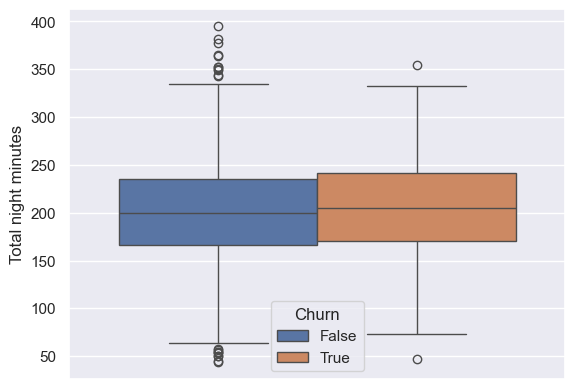

In [343]:
sns.boxplot(data= df,y = 'Total night minutes', hue= "Churn")

<Axes: xlabel='Total night minutes', ylabel='Total night minutes'>

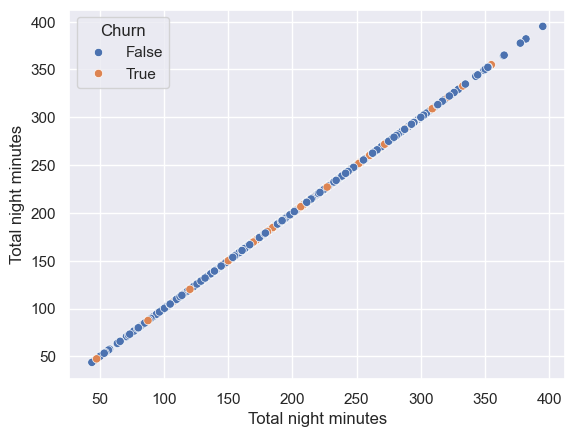

In [345]:
sns.scatterplot(data= df,x = 'Total night minutes',y = 'Total night minutes', hue= "Churn")

<Axes: xlabel='Total night minutes', ylabel='Total night charge'>

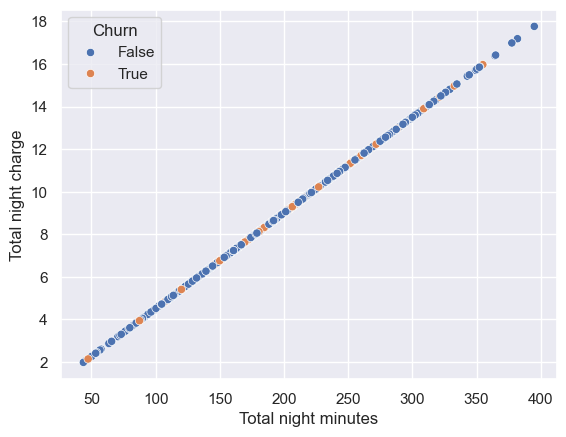

In [347]:
sns.scatterplot(data= df,x = 'Total night minutes',y = 'Total night charge', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total night minutes'>

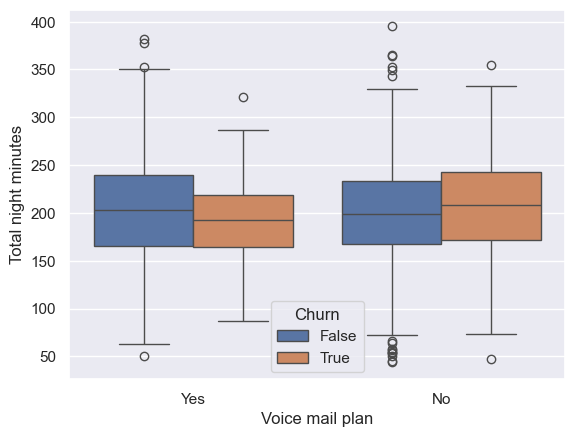

In [349]:
sns.boxplot(data= df,y = 'Total night minutes' ,x = "Voice mail plan", hue= "Churn")

<Axes: xlabel='Number vmail messages', ylabel='Total night minutes'>

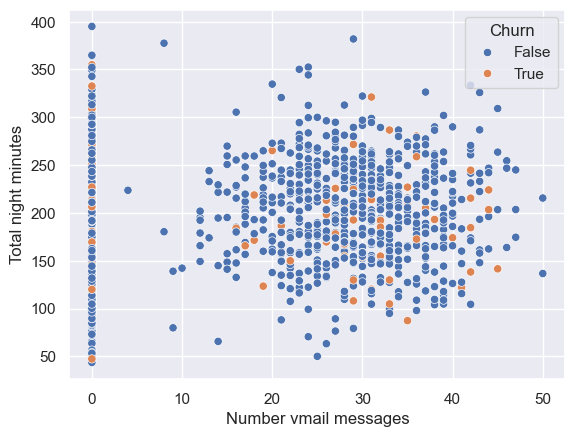

In [353]:
sns.scatterplot(data= df,y = 'Total night minutes',x = 'Number vmail messages', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total night minutes'>

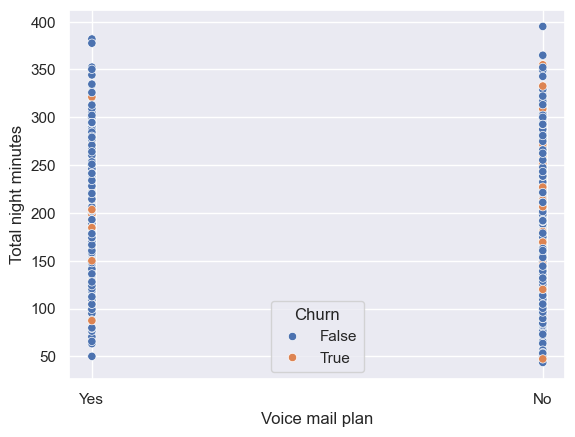

In [355]:
sns.scatterplot(data= df,y = 'Total night minutes',x = 'Voice mail plan', hue= "Churn")

In [357]:
len(df["Total night minutes"].unique())

1444

In [359]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
def transform_night_mins(num):
    if num <= 201:
        return "Less than 201"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 201"

In [361]:
df["Night minutes"] = df["Total night minutes"].apply(transform_night_mins)

In [363]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Day calls,Account size,Eve minutes,Eve calls,Night minutes
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 101,Greater than 127,Less than 200,Less than 100,Greater than 201
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Greater than 101,Between 100 and 127,Less than 200,Greater than 100,Greater than 201
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 101,Greater than 127,Less than 200,Greater than 100,Less than 201
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Less than 101,Between 73 and 100,Less than 200,Less than 100,Less than 201
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Greater than 101,Between 73 and 100,Less than 200,Greater than 100,Less than 201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False,Less than 101,Between 73 and 100,Less than 200,Less than 100,Greater than 201
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False,Less than 101,Greater than 127,Greater than 200,Greater than 100,Greater than 201
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False,Less than 101,Less than 73,Less than 200,Less than 100,Less than 201
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False,Greater than 101,Less than 73,Greater than 200,Less than 100,Less than 201


<Axes: xlabel='Night minutes'>

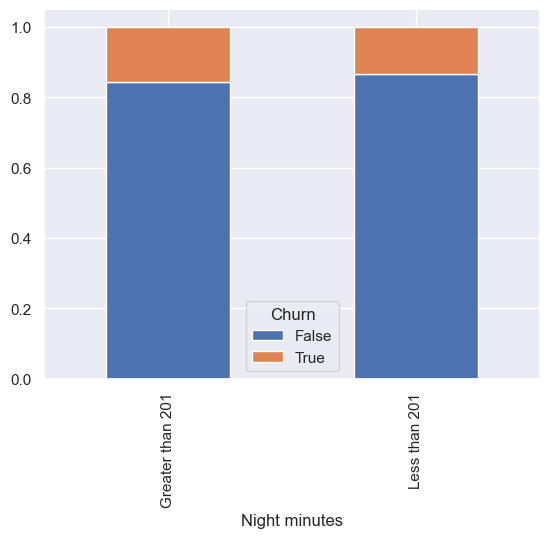

In [367]:
pd.crosstab(df['Night minutes'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [372]:
corr_value("Total night minutes")

The Corelation value with respect to Total night minutes is: 
Account length           -0.008994
Area code                -0.003353
Number vmail messages    -0.000224
Total day minutes         0.013491
Total day calls           0.008986
Total day charge          0.013495
Total eve minutes        -0.013414
Total eve calls          -0.000175
Total eve charge         -0.013428
Total night minutes       1.000000
Total night calls         0.012736
Total night charge        0.999999
Total intl minutes       -0.008607
Total intl calls         -0.001110
Total intl charge        -0.008510
Customer service calls    0.005236
Churn                     0.033639
Name: Total night minutes, dtype: float64


In [374]:
cor_min = df['Total night minutes'].corr(df['Churn'])
cor_charge = df['Total night charge'].corr(df['Churn'])
print(f"The correlation between Total night minutes and Churn is {cor_min}")
print(f"The correlation between Total night Charge and Churn is {cor_charge}")

The correlation between Total night minutes and Churn is 0.03363909290341836
The correlation between Total night Charge and Churn is 0.033635405020240344


### Total night calls
- As there is equal probability we ignore this feature

In [377]:
df["Total night calls"].describe()

count    2666.000000
mean      100.106152
std        19.418459
min        33.000000
25%        87.000000
50%       100.000000
75%       113.000000
max       166.000000
Name: Total night calls, dtype: float64

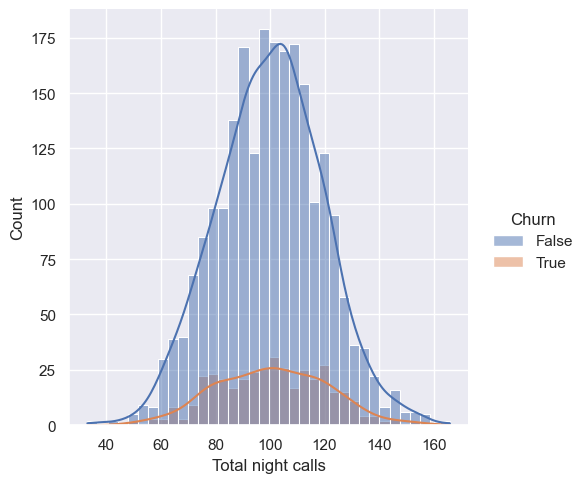

In [379]:
sns.displot(data = df, x = 'Total night calls',kde=True, hue = "Churn")

In [381]:
 len(df["Total eve calls"].unique())

120

In [383]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
def transform_night_calls(num):
    if num <= 100:
        return "Less than 100"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 100"

In [385]:
df["Night calls"] = df["Total night calls"].apply(transform_night_calls)

In [387]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Day calls,Account size,Eve minutes,Eve calls,Night minutes,Night calls
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 101,Greater than 127,Less than 200,Less than 100,Greater than 201,Less than 100
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Greater than 101,Between 100 and 127,Less than 200,Greater than 100,Greater than 201,Greater than 100
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 101,Greater than 127,Less than 200,Greater than 100,Less than 201,Greater than 100
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Less than 101,Between 73 and 100,Less than 200,Less than 100,Less than 201,Less than 100
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Greater than 101,Between 73 and 100,Less than 200,Greater than 100,Less than 201,Greater than 100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False,Less than 101,Between 73 and 100,Less than 200,Less than 100,Greater than 201,Greater than 100
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False,Less than 101,Greater than 127,Greater than 200,Greater than 100,Greater than 201,Less than 100
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False,Less than 101,Less than 73,Less than 200,Less than 100,Less than 201,Greater than 100
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False,Greater than 101,Less than 73,Greater than 200,Less than 100,Less than 201,Less than 100


<Axes: xlabel='Night calls'>

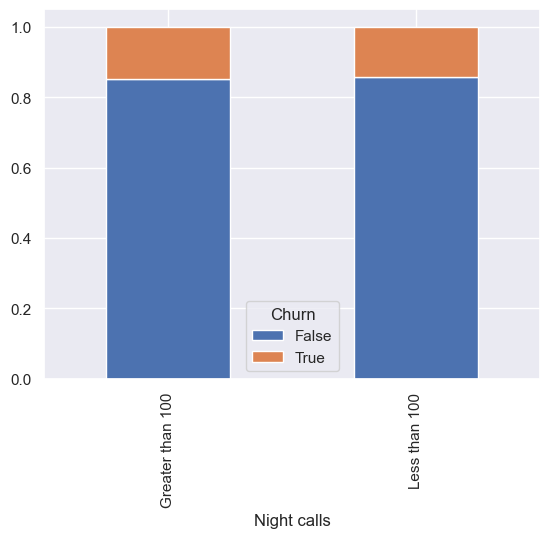

In [389]:
pd.crosstab(df['Night calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [391]:
corr_value("Total night calls")

The Corelation value with respect to Total night calls is: 
Account length           -0.024007
Area code                 0.011455
Number vmail messages     0.008124
Total day minutes         0.015054
Total day calls          -0.016776
Total day charge          0.015057
Total eve minutes         0.009017
Total eve calls           0.000797
Total eve charge          0.009030
Total night minutes       0.012736
Total night calls         1.000000
Total night charge        0.012720
Total intl minutes       -0.023447
Total intl calls          0.019367
Total intl charge        -0.023434
Customer service calls   -0.005677
Churn                     0.012262
Name: Total night calls, dtype: float64


### Total night charge
- As positively correlated with the Total night minutes hence we ignore

### Total intl minutes 
- Those who have international plan and  has the internation minute are more likely to exit
- positively correalted to the Total intl charge so we ignore Total intl charge feature
- Need to verity once doing the outlier treatement

In [401]:
df["Total intl minutes"].describe()

count    2666.000000
mean       10.237022
std         2.788349
min         0.000000
25%         8.500000
50%        10.200000
75%        12.100000
max        20.000000
Name: Total intl minutes, dtype: float64

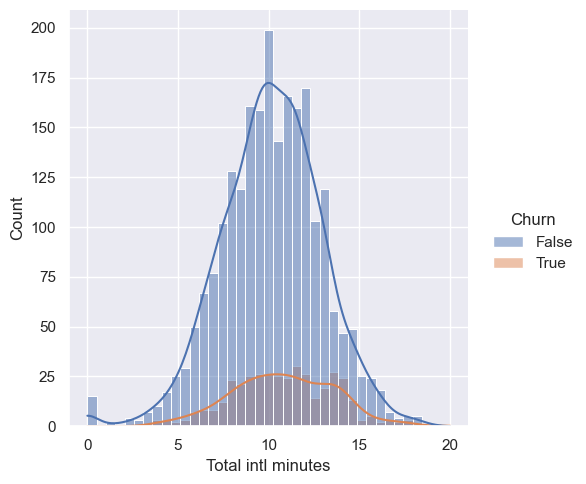

In [403]:
sns.displot(data = df, x = 'Total intl minutes',kde=True, hue = "Churn")

<Axes: ylabel='Total intl minutes'>

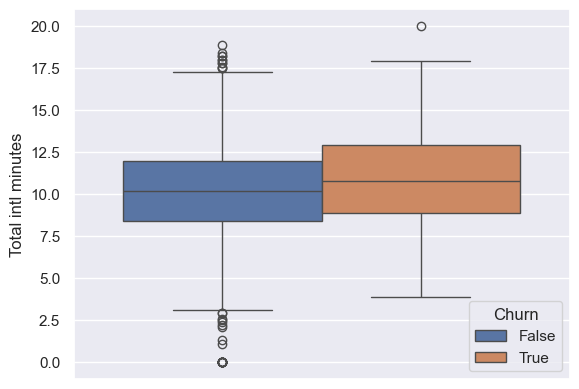

In [405]:
sns.boxplot(data= df,y = 'Total intl minutes', hue= "Churn")

<Axes: xlabel='Total intl minutes', ylabel='Total intl minutes'>

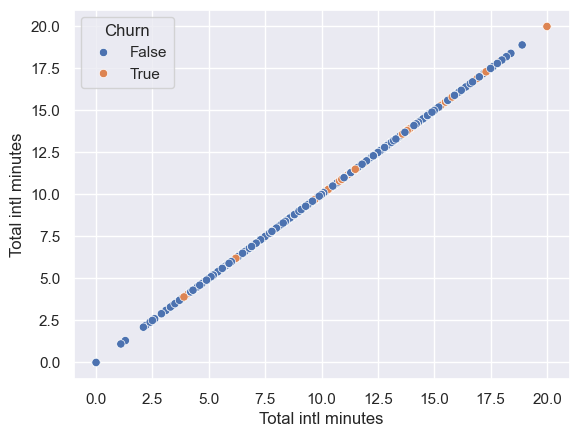

In [409]:
sns.scatterplot(data= df,x = 'Total intl minutes',y = 'Total intl minutes', hue= "Churn")

<Axes: xlabel='Total intl minutes', ylabel='Total intl charge'>

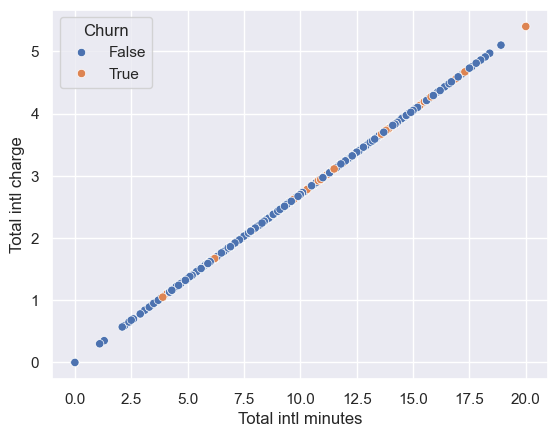

In [411]:
sns.scatterplot(data= df,x = 'Total intl minutes',y = 'Total intl charge', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total intl minutes'>

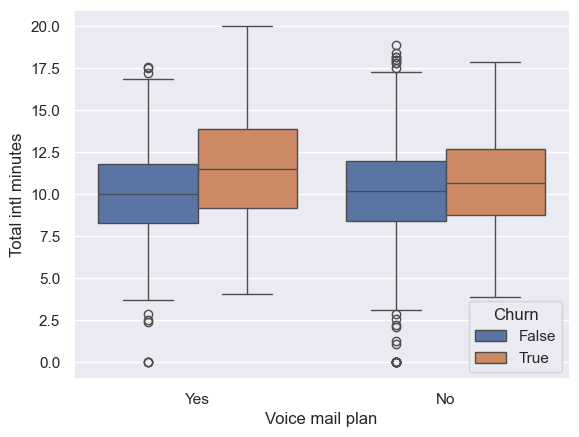

In [413]:
sns.boxplot(data= df,y = 'Total intl minutes' ,x = "Voice mail plan", hue= "Churn")

<Axes: xlabel='Number vmail messages', ylabel='Total intl minutes'>

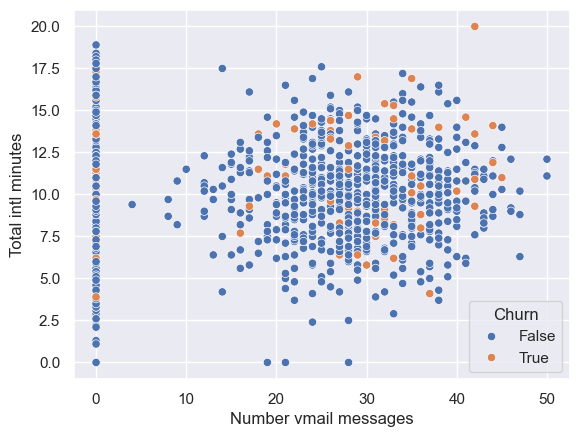

In [415]:
sns.scatterplot(data= df,y = 'Total intl minutes',x = 'Number vmail messages', hue= "Churn")

<Axes: xlabel='Voice mail plan', ylabel='Total intl minutes'>

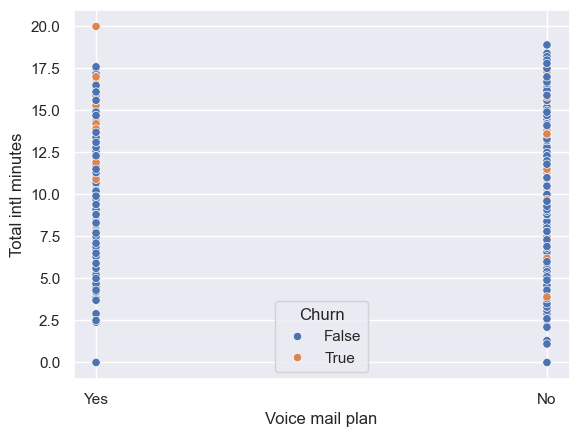

In [417]:
sns.scatterplot(data= df,y = 'Total intl minutes',x = 'Voice mail plan', hue= "Churn")

<Axes: xlabel='International plan', ylabel='Total intl minutes'>

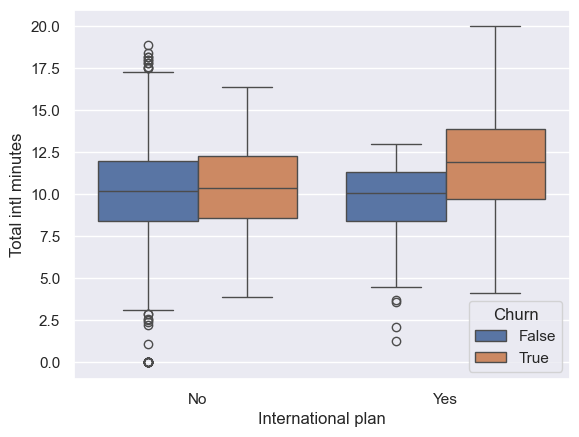

In [419]:
sns.boxplot(data= df,y = 'Total intl minutes' ,x = "International plan", hue= "Churn")

<Axes: xlabel='International plan', ylabel='Total intl minutes'>

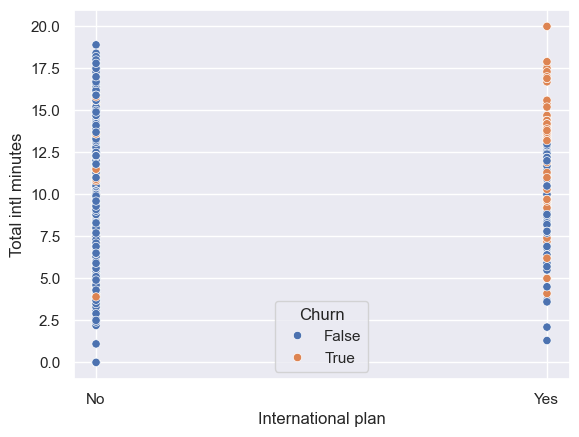

In [421]:
sns.scatterplot(data= df,y = 'Total intl minutes',x = 'International plan', hue= "Churn")

In [423]:
corr_value("Total intl minutes")

The Corelation value with respect to Total intl minutes is: 
Account length            0.011369
Area code                -0.013418
Number vmail messages    -0.004156
Total day minutes        -0.011042
Total day calls           0.031036
Total day charge         -0.011046
Total eve minutes        -0.006915
Total eve calls           0.011012
Total eve charge         -0.006923
Total night minutes      -0.008607
Total night calls        -0.023447
Total night charge       -0.008615
Total intl minutes        1.000000
Total intl calls          0.037315
Total intl charge         0.999993
Customer service calls   -0.002826
Churn                     0.086204
Name: Total intl minutes, dtype: float64


In [425]:
cor_min = df['Total intl minutes'].corr(df['Churn'])
cor_charge = df['Total intl charge'].corr(df['Churn'])
print(f"The correlation between Total intl minutes and Churn is {cor_min}")
print(f"The correlation between Total intl Charge and Churn is {cor_charge}")

The correlation between Total intl minutes and Churn is 0.08620377131557039
The correlation between Total intl Charge and Churn is 0.08621611819915347


### Total intl calls
- Not and definite result hence we ignore this column

In [434]:
df["Total intl calls"].describe()

count    2666.000000
mean        4.467367
std         2.456195
min         0.000000
25%         3.000000
50%         4.000000
75%         6.000000
max        20.000000
Name: Total intl calls, dtype: float64

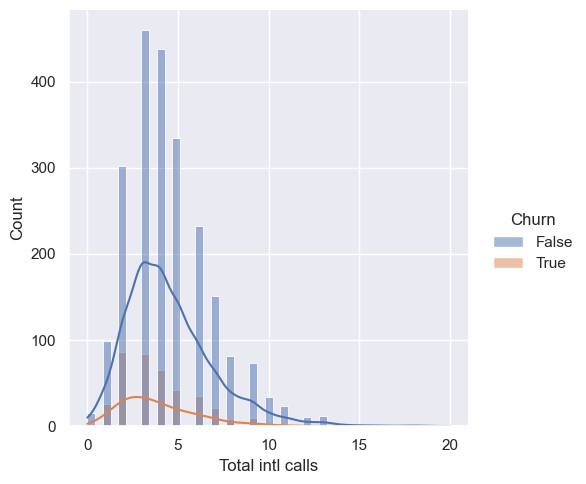

In [436]:
sns.displot(data = df, x = 'Total intl calls',kde=True, hue = "Churn")

In [440]:
 len(df["Total intl calls"].unique())

21

<Axes: xlabel='Total intl calls'>

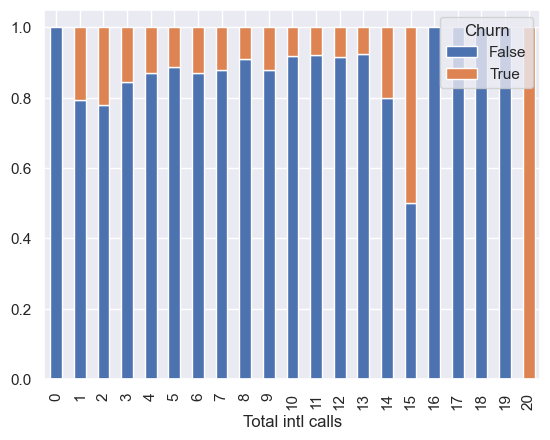

In [442]:
pd.crosstab(df['Total intl calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [460]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
def transform_intl_calls(num):
    if num <= 4:
        return "Less than 4"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 4"

In [462]:
df["Intl calls"] = df["Total intl calls"].apply(transform_intl_calls)

In [464]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Day calls,Account size,Eve minutes,Eve calls,Night minutes,Night calls,Intl calls
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 101,Greater than 127,Less than 200,Less than 100,Greater than 201,Less than 100,Less than 4
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Greater than 101,Between 100 and 127,Less than 200,Greater than 100,Greater than 201,Greater than 100,Less than 4
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 101,Greater than 127,Less than 200,Greater than 100,Less than 201,Greater than 100,Greater than 4
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Less than 101,Between 73 and 100,Less than 200,Less than 100,Less than 201,Less than 100,Greater than 4
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Greater than 101,Between 73 and 100,Less than 200,Greater than 100,Less than 201,Greater than 100,Less than 4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False,Less than 101,Between 73 and 100,Less than 200,Less than 100,Greater than 201,Greater than 100,Greater than 4
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False,Less than 101,Greater than 127,Greater than 200,Greater than 100,Greater than 201,Less than 100,Greater than 4
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False,Less than 101,Less than 73,Less than 200,Less than 100,Less than 201,Greater than 100,Less than 4
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False,Greater than 101,Less than 73,Greater than 200,Less than 100,Less than 201,Less than 100,Greater than 4


<Axes: xlabel='Intl calls'>

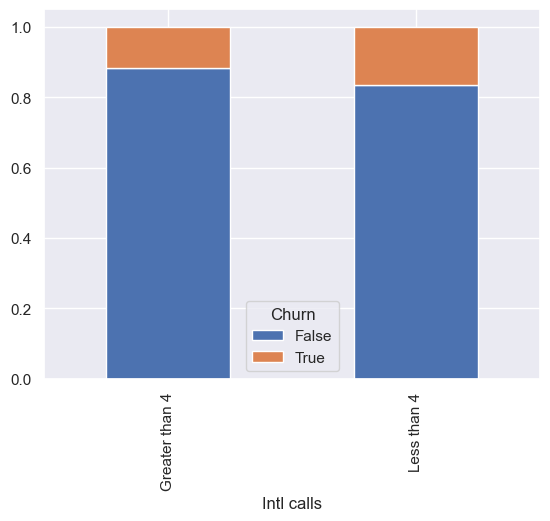

In [466]:
pd.crosstab(df['Intl calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

<Axes: xlabel='Intl calls'>

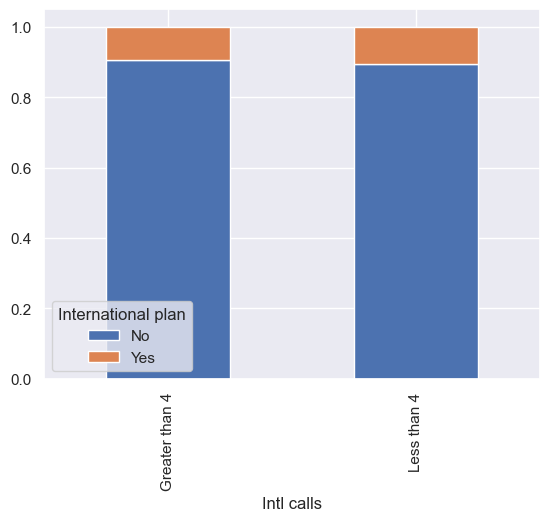

In [472]:
pd.crosstab(df['Intl calls'],df['International plan'],normalize='index').plot(kind='bar',stacked=True)

<Axes: xlabel='International plan', ylabel='Total intl calls'>

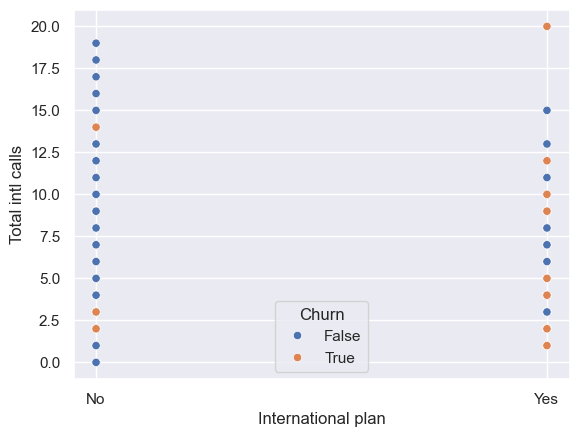

In [478]:
sns.scatterplot(data= df,y = 'Total intl calls',x = 'International plan', hue= "Churn")

<Axes: xlabel='Total intl minutes', ylabel='Total intl calls'>

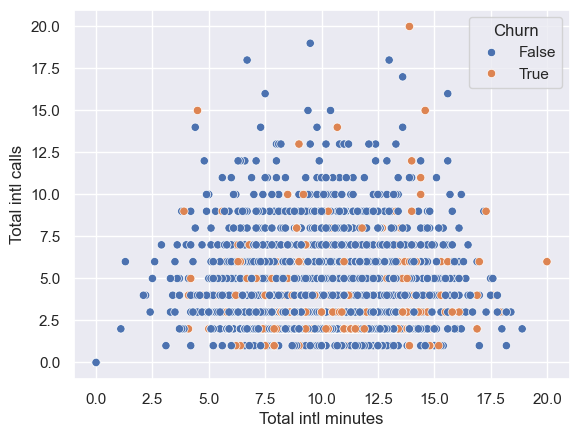

In [480]:
sns.scatterplot(data= df,y = 'Total intl calls',x = 'Total intl minutes', hue= "Churn")

### Customer service call
- With the customer service call more than 4 is more likely to Exit the service

In [488]:
df["Customer service calls"].describe()

count    2666.000000
mean        1.562641
std         1.311236
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         9.000000
Name: Customer service calls, dtype: float64

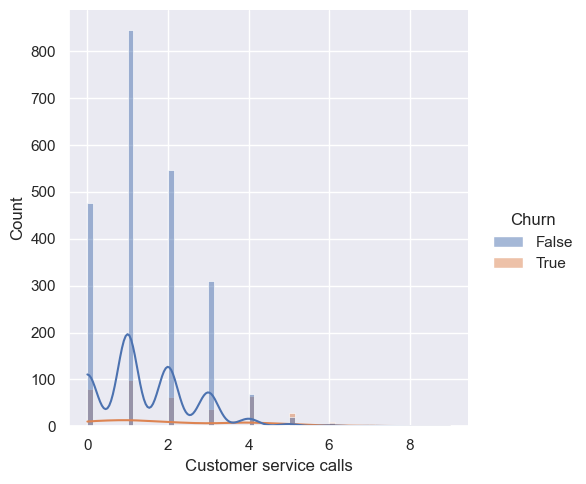

In [490]:
sns.displot(data = df, x = 'Customer service calls',kde=True, hue = "Churn")

<Axes: ylabel='Customer service calls'>

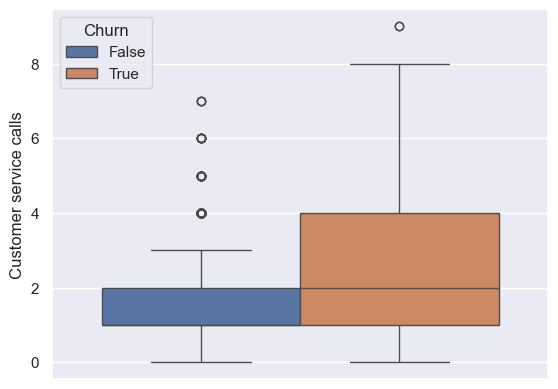

In [492]:
sns.boxplot(data= df,y = 'Customer service calls', hue= "Churn")

<Axes: xlabel='Customer service calls', ylabel='Customer service calls'>

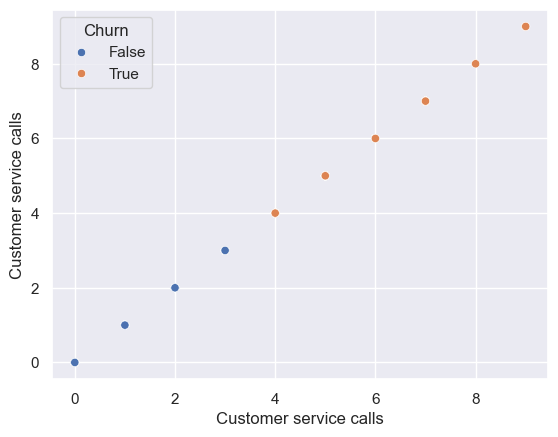

In [494]:
sns.scatterplot(data= df,x = 'Customer service calls',y = 'Customer service calls', hue= "Churn")

<Axes: xlabel='Customer service calls'>

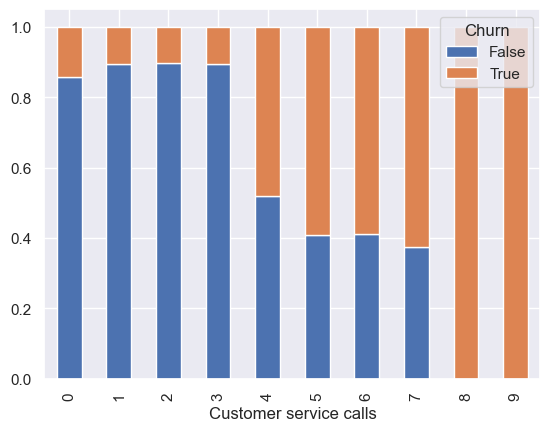

In [500]:
pd.crosstab(df['Customer service calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

In [502]:
# As there are 1442 Unique value create a new colume as per the 50% Quartile Distribution
def transform_cust_calls(num):
    if num <= 4:
        return "Less than 4"
    #elif num >73 and num <= 100:
       # return "Between 73 and 100"
    #elif num >100 and num <= 127:
        #return "Between 100 and 127"
    else:
        return "Greater than 4"

In [504]:
df["Cust calls"] = df["Customer service calls"].apply(transform_cust_calls)

In [506]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Day calls,Account size,Eve minutes,Eve calls,Night minutes,Night calls,Intl calls,Cust calls
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,Greater than 101,Greater than 127,Less than 200,Less than 100,Greater than 201,Less than 100,Less than 4,Less than 4
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,Greater than 101,Between 100 and 127,Less than 200,Greater than 100,Greater than 201,Greater than 100,Less than 4,Less than 4
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,Greater than 101,Greater than 127,Less than 200,Greater than 100,Less than 201,Greater than 100,Greater than 4,Less than 4
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,Less than 101,Between 73 and 100,Less than 200,Less than 100,Less than 201,Less than 100,Greater than 4,Less than 4
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,Greater than 101,Between 73 and 100,Less than 200,Greater than 100,Less than 201,Greater than 100,Less than 4,Less than 4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False,Less than 101,Between 73 and 100,Less than 200,Less than 100,Greater than 201,Greater than 100,Greater than 4,Less than 4
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False,Less than 101,Greater than 127,Greater than 200,Greater than 100,Greater than 201,Less than 100,Greater than 4,Less than 4
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False,Less than 101,Less than 73,Less than 200,Less than 100,Less than 201,Greater than 100,Less than 4,Less than 4
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False,Greater than 101,Less than 73,Greater than 200,Less than 100,Less than 201,Less than 100,Greater than 4,Less than 4


<Axes: xlabel='Cust calls'>

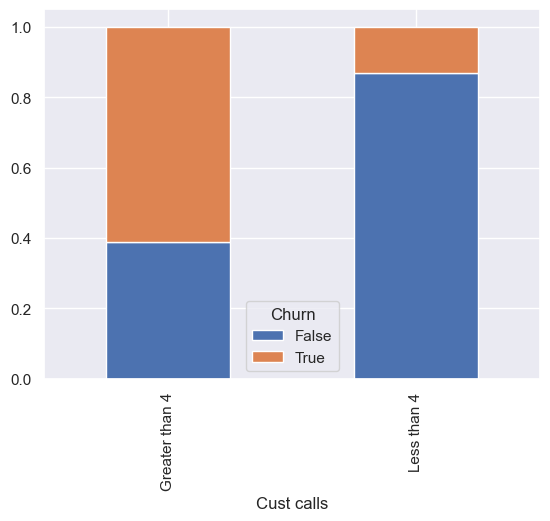

In [508]:
pd.crosstab(df['Cust calls'],df['Churn'],normalize='index').plot(kind='bar',stacked=True)

### Encoding
- Now we have completed the EDA part now we are goind to delete the extra feature that has been created during the EDA
- Also drop the feature that we have conclude that it is not required for the Model Training part
- Not we will start the Encoding Part as well

In [814]:
new_df = df.drop(col_to_drop,axis=1)

In [816]:
new_df

,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn
0,No,Yes,25,265.1,197.4,244.7,10.0,1,False
1,No,Yes,26,161.6,195.5,254.4,13.7,1,False
2,No,No,0,243.4,121.2,162.6,12.2,0,False
3,Yes,No,0,299.4,61.9,196.9,6.6,2,False
4,Yes,No,0,166.7,148.3,186.9,10.1,3,False
...,...,...,...,...,...,...,...,...,...
2661,No,No,0,134.7,189.7,221.4,11.8,2,False
2662,No,Yes,36,156.2,215.5,279.1,9.9,2,False
2663,No,No,0,231.1,153.4,191.3,9.6,3,False
2664,No,No,0,180.8,288.8,191.9,14.1,2,False


In [818]:
# Importing the library for the One Hot Encoding Part

new_df["Intl plan"] = pd.get_dummies(new_df["International plan"],drop_first=True,dtype=int)
new_df["Vmail plan"] =pd.get_dummies(new_df["Voice mail plan"],drop_first=True,dtype=int)
new_df

,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
0,No,Yes,25,265.1,197.4,244.7,10.0,1,False,0,1
1,No,Yes,26,161.6,195.5,254.4,13.7,1,False,0,1
2,No,No,0,243.4,121.2,162.6,12.2,0,False,0,0
3,Yes,No,0,299.4,61.9,196.9,6.6,2,False,1,0
4,Yes,No,0,166.7,148.3,186.9,10.1,3,False,1,0
...,...,...,...,...,...,...,...,...,...,...,...
2661,No,No,0,134.7,189.7,221.4,11.8,2,False,0,0
2662,No,Yes,36,156.2,215.5,279.1,9.9,2,False,0,1
2663,No,No,0,231.1,153.4,191.3,9.6,3,False,0,0
2664,No,No,0,180.8,288.8,191.9,14.1,2,False,0,0


In [820]:
new_df.drop(["International plan","Voice mail plan"],axis=1,inplace=True)
new_df

,Number vmail messages,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
0,25,265.1,197.4,244.7,10.0,1,False,0,1
1,26,161.6,195.5,254.4,13.7,1,False,0,1
2,0,243.4,121.2,162.6,12.2,0,False,0,0
3,0,299.4,61.9,196.9,6.6,2,False,1,0
4,0,166.7,148.3,186.9,10.1,3,False,1,0
...,...,...,...,...,...,...,...,...,...
2661,0,134.7,189.7,221.4,11.8,2,False,0,0
2662,36,156.2,215.5,279.1,9.9,2,False,0,1
2663,0,231.1,153.4,191.3,9.6,3,False,0,0
2664,0,180.8,288.8,191.9,14.1,2,False,0,0


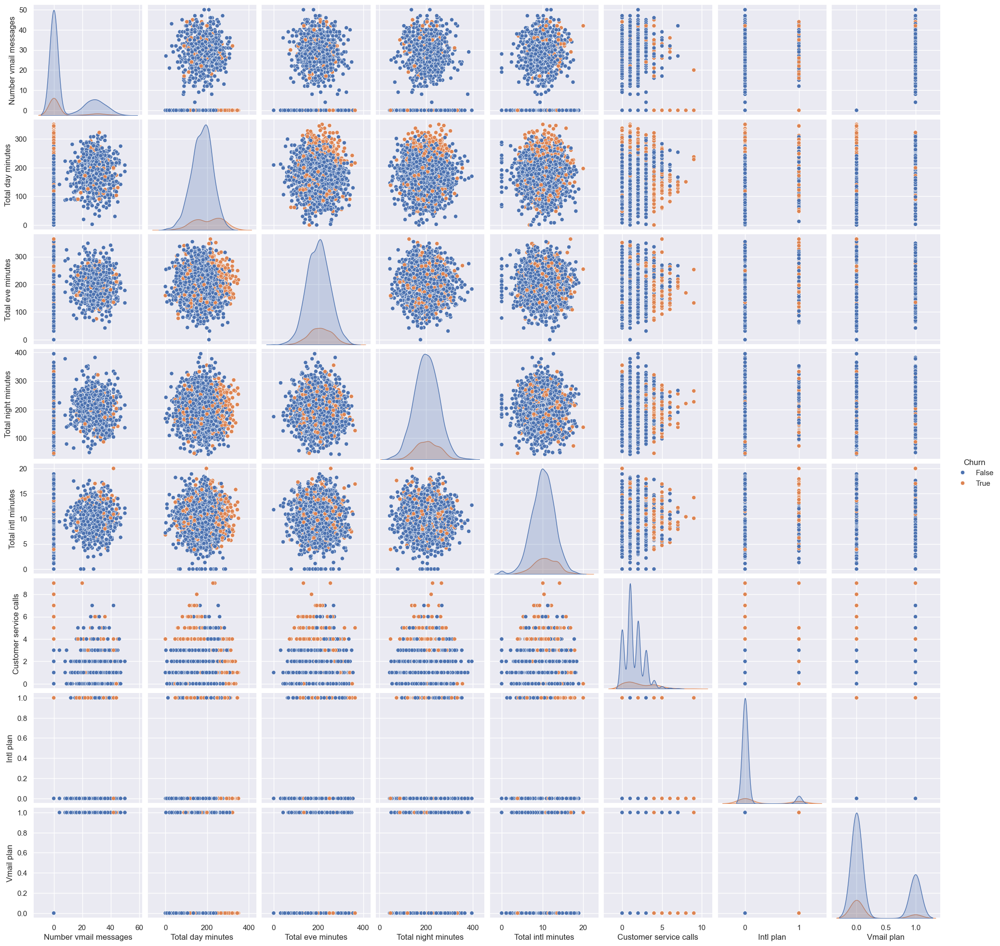

In [745]:
sns.pairplot(new_df,hue='Churn')

In [822]:
new_df.drop(["Number vmail messages"],axis=1,inplace=True)
new_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
0,265.1,197.4,244.7,10.0,1,False,0,1
1,161.6,195.5,254.4,13.7,1,False,0,1
2,243.4,121.2,162.6,12.2,0,False,0,0
3,299.4,61.9,196.9,6.6,2,False,1,0
4,166.7,148.3,186.9,10.1,3,False,1,0
...,...,...,...,...,...,...,...,...
2661,134.7,189.7,221.4,11.8,2,False,0,0
2662,156.2,215.5,279.1,9.9,2,False,0,1
2663,231.1,153.4,191.3,9.6,3,False,0,0
2664,180.8,288.8,191.9,14.1,2,False,0,0


### Outlier Treatment
- Now we try to treat the outlier found in the remaining features
- As Total day minuts , Total eve minutes, Total night minutes, Total intl minutes are Normal Distribution we will treat the outliers using the Z-score
- As Customer service calls are not normal distribution we will leave it as it is or replace the value greater than 4 with 4

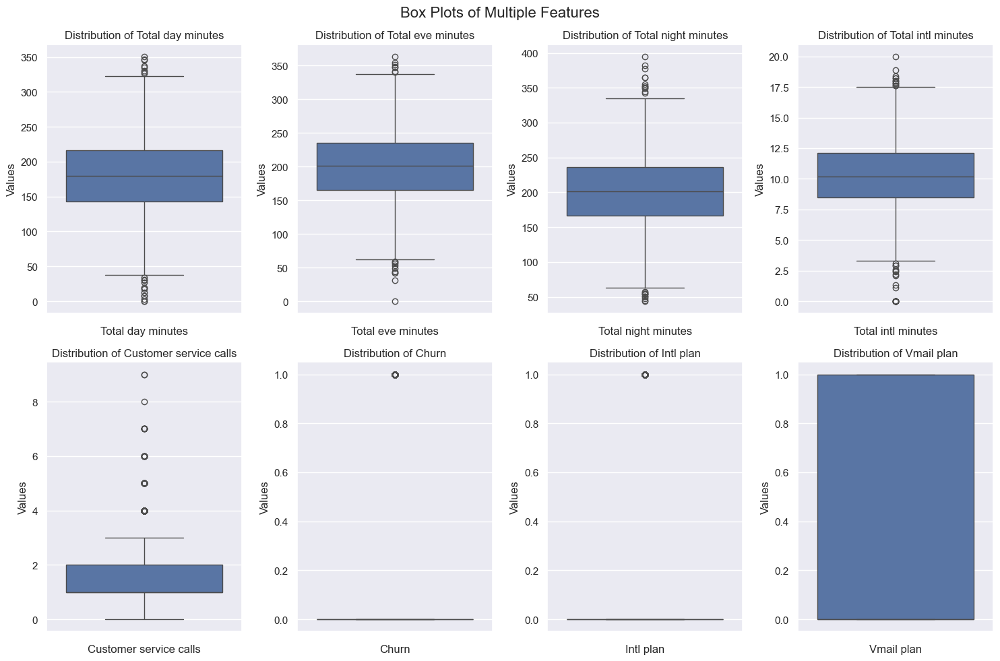

In [786]:
# Set up the plot
fig, axes = plt.subplots(2, 4, figsize=(15, 10))
fig.suptitle('Box Plots of Multiple Features', fontsize=16)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Create a box plot for each feature
for i, column in enumerate(new_df.columns):
    sns.boxplot(data=new_df[column], ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(f'{column}')
    axes[i].set_ylabel('Values')

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

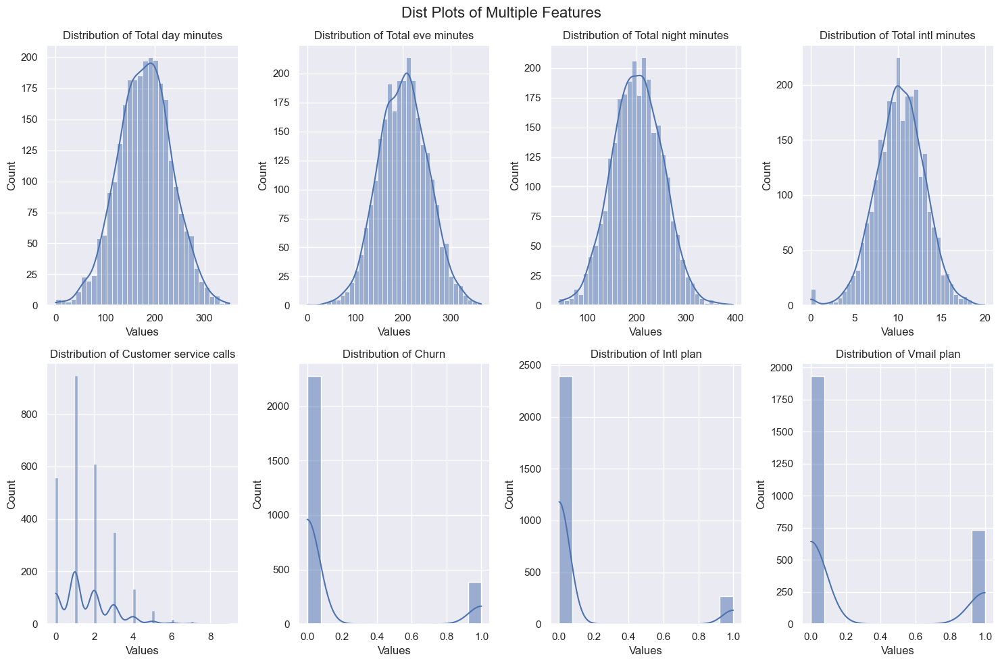

In [788]:
# Set up the plot
fig, axes = plt.subplots(2, 4, figsize=(15, 10))
fig.suptitle('Dist Plots of Multiple Features', fontsize=16)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Create a dist plot for each feature
for i, column in enumerate(new_df.columns):
    sns.histplot(data=new_df, x=column, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel('Values')
    axes[i].set_ylabel('Count')

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

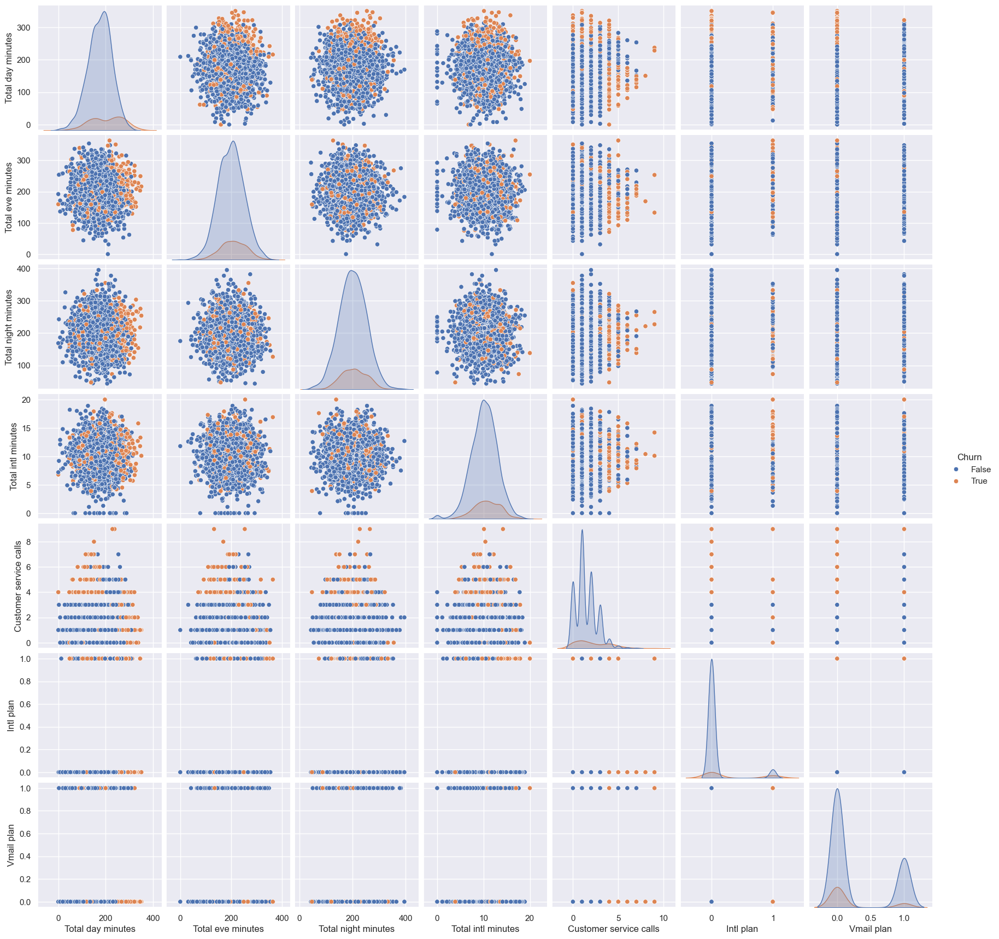

In [751]:
sns.pairplot(new_df,hue='Churn')

In [917]:
#Splitting Dependent (y) and independent (X) variables
X = new_df.drop(["Churn"],axis=1)
y = new_df["Churn"]

In [919]:
X

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Intl plan,Vmail plan
0,265.1,197.4,244.7,10.0,1,0,1
1,161.6,195.5,254.4,13.7,1,0,1
2,243.4,121.2,162.6,12.2,0,0,0
3,299.4,61.9,196.9,6.6,2,1,0
4,166.7,148.3,186.9,10.1,3,1,0
...,...,...,...,...,...,...,...
2661,134.7,189.7,221.4,11.8,2,0,0
2662,156.2,215.5,279.1,9.9,2,0,1
2663,231.1,153.4,191.3,9.6,3,0,0
2664,180.8,288.8,191.9,14.1,2,0,0


In [921]:
y

0       False
1       False
2       False
3       False
4       False
        ...  
2661    False
2662    False
2663    False
2664    False
2665    False
Name: Churn, Length: 2666, dtype: bool

In [923]:
# defining the fucntion to find the upper and lower bound of the data
def upper_lower(col):
    print(X[col].describe())
    upper = X[col].mean() + 3 * X[col].std()
    lower = X[col].mean() - 3 * X[col].std()
    upper_per = X[X[col]>upper].shape[0]/X.shape[0]
    lower_per = X[X[col]<lower].shape[0]/X.shape[0]
    print(f"{col} > {upper} is {upper_per*100:.2f}% and {col} < {lower} is {lower_per*100:.2f}%")
    return upper, lower

In [925]:
# Function to replae the outliers with upper and lower bound
def replace_outlier (col, upper , lower):
    X.loc[new_df[col] > upper, col] = upper
    X.loc[new_df[col] < lower, col] = lower

In [927]:
#Function to print the data with upper and lower bound
def print_df(col,upper,lower):
    u_df = new_df[new_df[col]>upper]
    l_df = new_df[new_df[col]<lower]
    return u_df, l_df

### Feature Total day minutes
- As the Outliers is very minimal so there is not much neccessary to treat the outliers.
- As Treating the upper bound which is 342 is not necessary
- As Terating the lower bound which is 16 might mislead the data who have 0 day minutes

In [930]:
upper, lower = upper_lower("Total day minutes")

count    2666.00000
mean      179.48162
std        54.21035
min         0.00000
25%       143.40000
50%       179.95000
75%       215.90000
max       350.80000
Name: Total day minutes, dtype: float64
Total day minutes > 342.11267106771083 is 0.11% and Total day minutes < 16.8505697424917 is 0.23%


In [932]:
u_df, l_df = print_df("Total day minutes",upper,lower)

In [934]:
u_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
296,350.8,216.5,253.9,10.1,1,True,0,0
780,346.8,249.5,275.4,13.3,1,True,1,0
2087,345.3,203.4,217.5,11.8,1,True,1,0


In [936]:
l_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
833,12.5,256.6,169.4,7.7,1,False,1,0
1057,0.0,159.6,167.1,6.8,4,True,0,0
1100,0.0,192.1,168.8,7.2,1,False,0,0
1575,7.9,136.4,156.6,12.1,0,False,0,0
2206,2.6,254.0,242.7,9.2,3,False,0,1
2218,7.8,171.4,186.5,12.9,2,False,0,0


### Total eve minutes
- As the Outliers is very minimal so there is not much neccessary to treat the outliers.- 
As Treating the upper bound which is 532 is not necessar and only 2 values are there.
- 
As Terating the lower bound which i4716 might mislead the data who have 0 day minutes

In [944]:
upper, lower = upper_lower("Total eve minutes")

count    2666.000000
mean      200.386159
std        50.951515
min         0.000000
25%       165.300000
50%       200.900000
75%       235.100000
max       363.700000
Name: Total eve minutes, dtype: float64
Total eve minutes > 353.24070439269775 is 0.08% and Total eve minutes < 47.53161368682214 is 0.19%


In [948]:
u_df, l_df = print_df("Total eve minutes",upper,lower)

In [950]:
u_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
2054,129.5,354.2,145.5,10.9,1,False,0,0
2202,216.2,363.7,126.7,16.9,5,True,1,0


In [952]:
l_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
27,212.0,31.2,293.3,12.6,3,False,0,0
429,201.3,42.2,125.7,5.4,1,False,0,1
647,105.8,43.9,189.6,13.1,0,False,0,0
704,198.5,42.5,179.2,12.4,0,False,0,0
2358,209.2,0.0,175.4,11.8,1,False,0,0


### Total night minutes
- As the Outliers is very minimal so there is not much neccessary to treat the outliers.
- As Treating the upper bound which is 353 is not necessary and only 6 values are there.
- As Terating the lower bound which is 48 might have only 3 data

In [957]:
upper, lower = upper_lower("Total night minutes")

count    2666.000000
mean      201.168942
std        50.780323
min        43.700000
25%       166.925000
50%       201.150000
75%       236.475000
max       395.000000
Name: Total night minutes, dtype: float64
Total night minutes > 353.50991234173466 is 0.23% and Total night minutes < 48.827972129383056 is 0.11%


In [959]:
u_df, l_df = print_df("Total night minutes",upper,lower)

In [961]:
u_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
201,198.5,267.8,354.9,9.4,0,True,0,0
733,239.9,142.3,364.3,9.3,1,False,0,0
1035,163.5,274.8,381.9,7.5,2,False,0,1
1137,222.5,171.5,377.5,9.7,1,False,0,1
2142,169.8,183.1,395.0,12.7,2,False,0,0
2495,157.6,198.3,364.9,9.1,1,False,0,0


In [963]:
l_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
698,146.3,255.9,45.0,8.0,1,False,0,0
878,206.3,292.8,43.7,10.6,1,False,0,0
2598,138.4,158.9,47.4,3.9,4,True,0,0


### Total intl minutes
- As the Outliers is very minimal so there is not much neccessary to treat the outliers.
- As Treating the upper bound which is 18 is not necessary and only 2 values are there.
- As Terating the lower bound which is 1 might mislead the data who have 0 day minutes

In [971]:
upper, lower = upper_lower("Total intl minutes")

count    2666.000000
mean       10.237022
std         2.788349
min         0.000000
25%         8.500000
50%        10.200000
75%        12.100000
max        20.000000
Name: Total intl minutes, dtype: float64
Total intl minutes > 18.602067486592656 is 0.08% and Total intl minutes < 1.8719760242850647 is 0.64%


In [973]:
u_df, l_df = print_df("Total intl minutes",upper,lower)

In [975]:
u_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
93,196.8,254.9,138.3,20.0,0,True,1,1
251,125.2,205.4,254.4,18.9,0,False,0,0


In [977]:
l_df

,Total day minutes,Total eve minutes,Total night minutes,Total intl minutes,Customer service calls,Churn,Intl plan,Vmail plan
145,232.1,292.3,201.2,0.0,3,False,0,0
278,64.6,176.1,244.8,0.0,2,False,0,1
393,242.9,209.8,228.4,0.0,1,False,0,0
477,151.4,152.4,250.1,0.0,1,False,0,1
559,114.4,78.3,232.7,0.0,2,False,0,0
600,189.6,267.4,184.5,1.3,1,False,1,0
694,281.0,160.6,77.9,0.0,1,False,0,0
814,222.8,215.9,223.5,0.0,1,False,0,0
853,191.5,175.2,220.3,0.0,0,False,0,0
1103,132.0,197.5,175.8,0.0,3,False,0,0


### Spliting Train and Test Data

In [981]:
# Importing the library

from sklearn.model_selection import train_test_split

In [983]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [985]:
X_train.shape

(1866, 7)

In [989]:
X_test.shape

(800, 7)

### Feature Scaling

In [992]:
# Importing the Library

from sklearn.preprocessing import MinMaxScaler,StandardScaler

In [996]:
# We will use the min max scaller that will change the value from 0 to 1 as there are certail minimal Outliers in the data

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Model Training

In [1009]:
# importing all the Algorithm that can be used

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier

### Trying Random Forest Regression

In [1115]:
model = RandomForestClassifier()

In [1117]:
model.fit(X_train,y_train)

RandomForestClassifier()

In [1119]:
model.score(X_test,y_test)

0.935

### Confustion Matix adn Classification Report

In [1122]:
from sklearn.metrics import confusion_matrix,classification_report

In [1124]:
y_pred = model.predict(X_test)

In [1126]:
cm = confusion_matrix(y_test,y_pred)
print(cm)

[[679   4]
 [ 48  69]]


Text(92.25, 0.5, 'Truth')

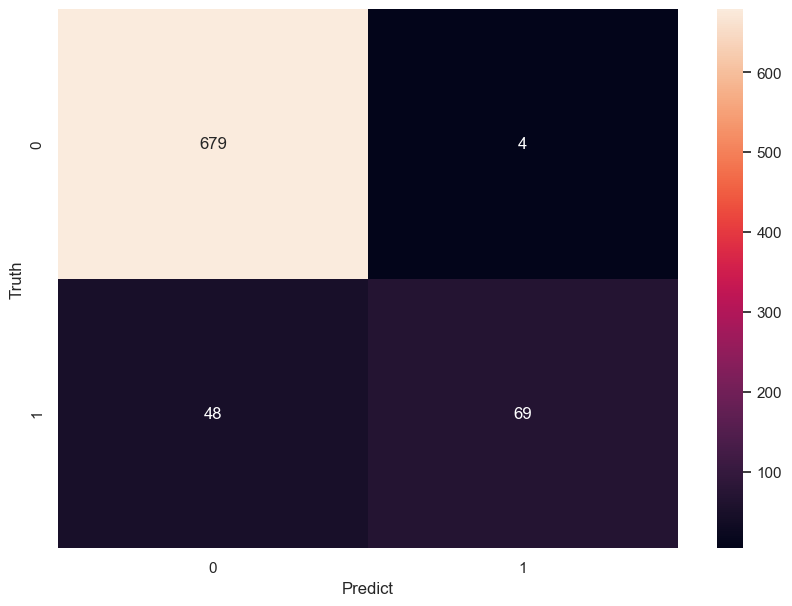

In [1128]:
plt.figure(figsize=(10,7))
sns.heatmap(cm,annot=True,fmt="d")
plt.xlabel("Predict")
plt.ylabel("Truth")

In [1135]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

       False       0.93      0.99      0.96       683
        True       0.95      0.59      0.73       117

    accuracy                           0.94       800
   macro avg       0.94      0.79      0.84       800
weighted avg       0.94      0.94      0.93       800



### Hyper parameter tuning

In [1144]:
# Finding the Best model out of all the selected model using the loop and dictionary and Grid Search CV

In [1275]:
# Creating a dictionary
model_params = {
    "logistic_regression":{
        "model":LogisticRegression(),
        "params":{
            "C":[1,5,10,100],
            "max_iter":[100,150,200]
        }
    },
    "naive_bayes":{
        "model":BernoulliNB(),
        "params":{
            "alpha":[0.1,0.5,0.9,1.0,1.5],
            "fit_prior":[True,False]
        }
    },
    "KNN":{
        "model":KNeighborsClassifier(),
        "params":{
            "n_neighbors":[3,5,7,9,11,13],
            "weights":["uniform",'distance'],
            "p":[1,2]
        }
    },
    "SVM":{
        "model":SVC(),
        "params":{
            'C':[0.25,0.4,0.5,0.6,0.7,0.8,0.9,1],
            'gamma':[0.5,0.6,0.7,0.8,0.9,1.0],
            'kernel':['rbf','linear']
        }
    },
    "Decision_Tree":{
        "model":DecisionTreeClassifier(),
        "params":{
            "max_depth": [None, 10, 20],
            "min_samples_split": [2, 5, 10],
            "min_samples_leaf": [1, 2, 4],
            "max_features": [None, "sqrt", "log2"],
            "max_leaf_nodes": [None, 10, 20, 30],
        }
    },
    "Random_Forest":{
        "model":RandomForestClassifier(),
        "params":{
            "n_estimators": [100, 200, 300, 400, 500],
            "max_depth": [None, 10, 20,50],
            "min_samples_split": [2, 5, 10],
            "min_samples_leaf": [1, 2, 4],
        }
    },
    "AdaBoost":{
        "model":AdaBoostClassifier(),
        "params":{
            "n_estimators": [100, 200, 300, 400, 500],
            "learning_rate": [0.01, 0.1, 0.5, 1.0, 1.5],
            'algorithm' : ['SAMME']
        
        }
    }
}

In [1277]:
# Improting Library

from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [1279]:
# Looping Through all the models and prameters for hyper parameter tuning

scores = []

for model_name, mp in model_params.items():
    clf = RandomizedSearchCV(mp["model"],mp["params"], cv = 5, return_train_score= False)
    clf.fit(X_train,y_train)
    scores.append({
        "model" : model_name,
        "best_score" : clf.best_score_,
        "best_params": clf.best_params_
    })

In [1280]:
best_params_df = pd.DataFrame(scores,columns=["model","best_score","best_params"])
best_params_df

,model,best_score,best_params
0,logistic_regression,0.858521,"{'max_iter': 200, 'C': 5}"
1,naive_bayes,0.852090,"{'fit_prior': True, 'alpha': 1.0}"
2,KNN,0.905148,"{'weights': 'distance', 'p': 2, 'n_neighbors': 9}"
3,SVM,0.861738,"{'kernel': 'rbf', 'gamma': 0.7, 'C': 1}"
4,Decision_Tree,0.909438,"{'min_samples_split': 2, 'min_samples_leaf': 2..."
5,Random_Forest,0.934620,"{'n_estimators': 400, 'min_samples_split': 2, ..."
6,AdaBoost,0.869233,"{'n_estimators': 300, 'learning_rate': 1.5, 'a..."


### Choosing the Best Parameters

In [1292]:
scores

[{'model': 'logistic_regression',
  'best_score': 0.858521024788175,
  'best_params': {'max_iter': 200, 'C': 5}},
 {'model': 'naive_bayes',
  'best_score': 0.8520895757766913,
  'best_params': {'fit_prior': True, 'alpha': 1.0}},
 {'model': 'KNN',
  'best_score': 0.905148313285831,
  'best_params': {'weights': 'distance', 'p': 2, 'n_neighbors': 9}},
 {'model': 'SVM',
  'best_score': 0.8617381829651188,
  'best_params': {'kernel': 'rbf', 'gamma': 0.7, 'C': 1}},
 {'model': 'Decision_Tree',
  'best_score': 0.909437857521756,
  'best_params': {'min_samples_split': 2,
   'min_samples_leaf': 2,
   'max_leaf_nodes': 10,
   'max_features': None,
   'max_depth': 20}},
 {'model': 'Random_Forest',
  'best_score': 0.9346202921821909,
  'best_params': {'n_estimators': 400,
   'min_samples_split': 2,
   'min_samples_leaf': 1,
   'max_depth': 20}},
 {'model': 'AdaBoost',
  'best_score': 0.8692334160083727,
  'best_params': {'n_estimators': 300,
   'learning_rate': 1.5,
   'algorithm': 'SAMME'}}]

In [1294]:
model = RandomForestClassifier(n_estimators=400,min_samples_split=2,min_samples_leaf=1,max_depth=20)

In [1296]:
model.fit(X_train,y_train)

RandomForestClassifier(max_depth=20, n_estimators=400)

In [1298]:
model.score(X_test,y_test)

0.9375

In [1300]:
y_pred = model.predict(X_test)

In [1302]:
cm = confusion_matrix(y_test,y_pred)
print(cm)

[[679   4]
 [ 46  71]]


Text(92.25, 0.5, 'Truth')

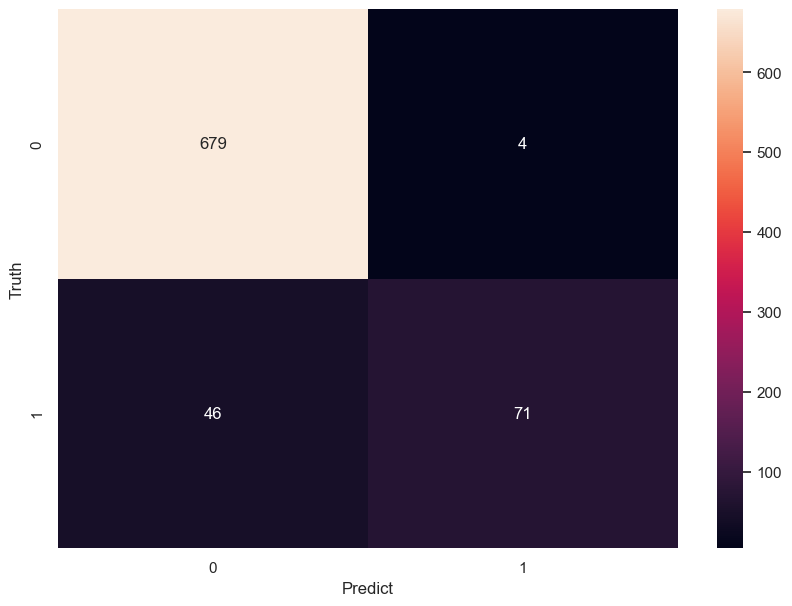

In [1304]:
plt.figure(figsize=(10,7))
sns.heatmap(cm,annot=True,fmt="d")
plt.xlabel("Predict")
plt.ylabel("Truth")

In [1306]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

       False       0.94      0.99      0.96       683
        True       0.95      0.61      0.74       117

    accuracy                           0.94       800
   macro avg       0.94      0.80      0.85       800
weighted avg       0.94      0.94      0.93       800



### Conclusion
- Still The F1 Score for the True Case was not improved so much.
- It is due to imbalanced dataset as there was less number of True case to Train the model